# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> **Data Science Project: Tumor Detection and Segmentation**
## **Milestone 5: Final Report**


**Harvard University**<br/>
**Spring 2023**<br/>
**Instructors**: Mark Glickman & Pavlos Protopapas

**Group 30**: Danning Lai, Sijia Li, Yuqing Pan, Xu Tang, and Hanlin Zhu

<hr style="height:2pt">


<a id="contents"></a>

# **Notebook Contents**

- [**Part 1 - Import Libraries and Load Data**](#part1)

- [**Part 2 - Data Preprocessing and Exploratory Data Analysis**](#part2)

- [**Part 3 - Project Question**](#part3)

- [**Part 4 - Baseline Classification Model: FFNN**](#part4)

- [**Part 5 - Advanced Classification Model: CNN**](#part5)

- [**Part 6 - CNN Model Visualization: Activation Maps and Saliency Maps**](#part6)

- [**Part 7 - Baseline Tumor Detection and Segmentation: UNet**](#part7)

- [**Part 8 - Advanced Tumor Detection and Segmentation: LinkNet**](#part8)

- [**Part 9 - Advanced Tumor Detection and Segmentation: DeeplabV3+**](#part9)

- [**Part 10 - Conclusion**](#part10)

- [**Part 11 - Future Work**](#part11)


<a id="part1"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **1.0 Import Libraries and Load Data**

<a id="part1"></a>

[Return to contents](#contents)

In [ ]:
import requests
from IPython.core.display import HTML
styles = requests.get("https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/cs109.css").text
HTML(styles)

In [ ]:
# Mount google drive 
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Install needed packages
!pip install pymatreader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! pip install tf_keras_vis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.1/52.1 kB 2.4 MB/s eta 0:00:00


In [ ]:
# Load packages
from os import walk
import matplotlib.pyplot as plt
import albumentations as A
import cv2
from PIL import Image
import numpy as np
import os
import pymatreader
import tensorflow as tf
import tensorflow_datasets as tfds
import time
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Activation, BatchNormalization
from tensorflow.keras.layers import Conv2D, Dense, Dropout, GaussianNoise
from tensorflow.keras.layers import Flatten, Input, MaxPooling2D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.regularizers import L1, L2
from tensorflow.keras.callbacks import EarlyStopping, LambdaCallback, ModelCheckpoint
from tensorflow.keras.utils import to_categorical
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.scores import CategoricalScore
from tensorflow.keras import layers, models, applications
from tensorflow import keras

path = 'drive/MyDrive/brainTumorDataPublic/'

The code depends on a variety of libraries for different purposes. The os library is used for directory traversal and file path handling. matplotlib is used for generating visualizations and graphs. albumentations is a library for image augmentation, which is used alongside cv2 (OpenCV) and PIL (Python Imaging Library) for image processing. numpy is used for numerical operations and pymatreader is used for reading MATLAB files. tensorflow and tensorflow_datasets are used for deep learning, with various modules and classes such as Sequential, Model, Activation, BatchNormalization, Conv2D, Dense, Dropout, Flatten, MaxPooling2D, Adam, SGD, L1, L2, EarlyStopping, ModelCheckpoint, and to_categorical. Finally, the tf_keras_vis library provides visualization tools for deep learning models, specifically Saliency, Gradcam, and CategoricalScore. Overall, these libraries enable a wide range of image processing and deep learning tasks in the code.

## 1.1 Data Source
Brain tumor MRI scans from FIGSHARE from Southern Medical School in Guangzhou (link) is the data used for this project. The dataset is obtained from the link provided by the AC209B teaching team, consisting of 4 subsets in .zip files, each contains 766 scans and is organized in matlab data format (.mat file). Loading the .zip files in Python, we observe that each file contains a struct with fields such as cjdata.label, cjdata.PID, cjdata.image, cjdata.tumorBorder, and cjdata.tumorMask. These fields provide information on the tumor type, patient ID, image data, coordinates of points on the tumor border (x1, y1, x2, y2), and a binary image of the tumor mask (where 1 implies the tumor region). The tumor border coordinates can be used to generate a binary image of the tumor mask. In total, there are 3,064 T1-weighted contrast-enhanced images of three brain tumor types (meningioma, glioma, and pituitary, corresponding to labels 1, 2, and 3) from 233 patients, and 3,064 tumor masks corresponding to each MRI scan. The MRI scans were taken from three different planes: axial, coronal, and sagittal.

In [ ]:
# Load in images, masks, and labels
idx_to_name={1:"meningioma",2:"glioma",3:"pituitary"}

imgs=[]
labels=[]
masks=[]
imgnames=[]
from pymatreader import read_mat 
from tqdm import trange

for (dirpath, dirnames, filenames) in walk(path):
    for i in trange(0,len(filenames)):
        if filenames[i].endswith(".mat"):
            imgnames.append(filenames[i])
            full_name = os.path.join(dirpath,filenames[i])
            data = read_mat(full_name)
            img = data["cjdata"]['image']
            imgs.append(img)
            labels.append(int(data["cjdata"]['label']))
            masks.append(data["cjdata"]['tumorMask'])

0it [00:00, ?it/s]
100%|██████████| 766/766 [00:07<00:00, 107.77it/s]


## 1.2 Data Summary
The original dataset contains 708 meningioma tumor (label=1), 1,426 glioma tumor (label=2), and 930 pituitary tumor (label=3) MRI images stored in matlab data format (3,064 images in total). 15 images are 256x256 and the remaining 3,049 are 512x512 in grayscale. The minimum and maximum pixel values across all images are -17 and 12,728, respectively. Some random examples of each brain tumor type from the axial, coronal, and sagittal planes. Four random examples are displayed for each tumor type (with mask superimposed).

,counts
1,708
2,1426
3,930


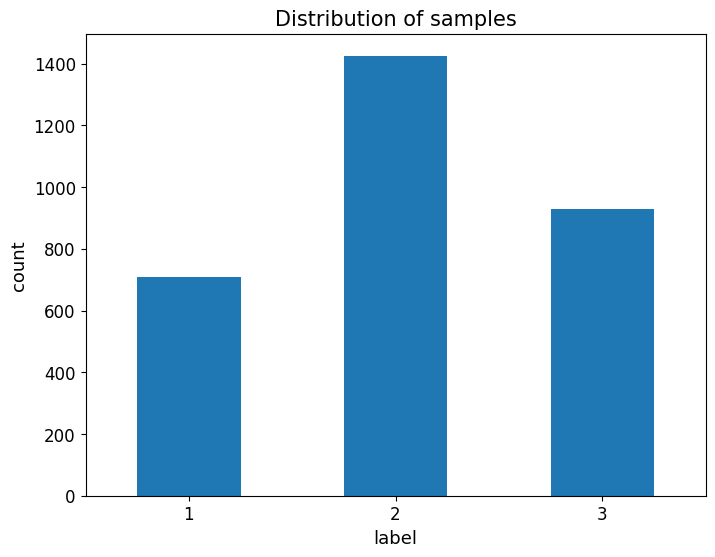

In [ ]:
# Sample distribution

import pandas as pd
unique_labels, counts = np.unique(labels, return_counts=True)
ax=pd.DataFrame({'counts': counts}, index=unique_labels).plot(kind='bar',figsize=[8,6], fontsize=15, width=0.5)
ax.set_xlabel("label",fontsize=13)
ax.set_ylabel("count",fontsize=13)
ax.get_legend().remove()
ax.tick_params(labelsize=12,rotation=0)
ax.set_title("Distribution of samples",fontsize=15)
display(pd.DataFrame({'counts': counts}, index=unique_labels))

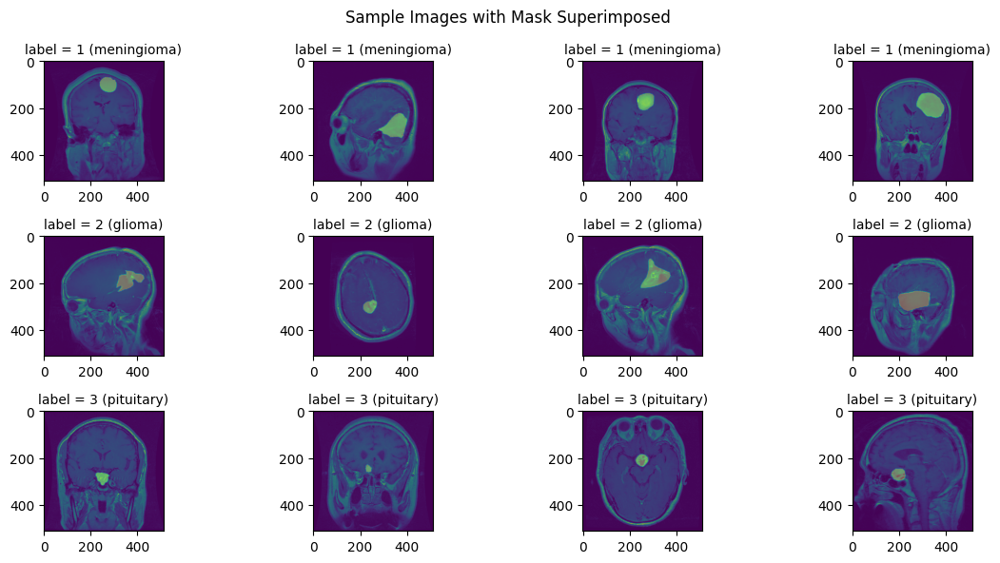

In [ ]:
# Preview visualize some images, with masks
ncols = 4
nrows = 3
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=[12, 6])
for j in np.arange(ncols):
    for i in np.arange(nrows):
      idx = np.array(range(len(labels)))
      idx = idx[labels==(i+1)]
      idx_subsampled = np.random.choice(idx, ncols) 
      ax[i,j].imshow(imgs[idx_subsampled[j]])
      ax[i,j].imshow(masks[idx_subsampled[j]],alpha=0.3)
      ax[i,j].set_title(f"label = {labels[idx_subsampled[j]]} ({idx_to_name[labels[idx_subsampled[j]]]})",fontsize=10)
      
plt.subplots_adjust(wspace=0, hspace=0.1)
plt.suptitle('Sample Images with Mask Superimposed')
plt.tight_layout()

<a id="part2"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **2.0 Data Preprocessing and Exploratory Data Analysis**

<a id="part2"></a>

[Return to contents](#contents)

Data cleaning and preprocessing are performed to convert the data into a consistent format, including resizing images, converting data to NumPy array types, applying one-hot-encoding on response variable, performing data normalization, splitting data into train and test sets, oversampling to rebalance data, and augmenting data.

## 2.1 Data Missingness
Each MRI scan image is labeled with its class number from {1: meningioma, 2: glioma, 3: pituitary}. There is no missingness to deal with in the dataset.

## 2.2 Data Resizing and Data Type Conversion
The MRI scans are of different pixel sizes, 15 images are 256x256 and the remaining 3,049 images are 512x512. In order to feed the data into neural networks, the input images must have the same pixel size. To account for this, the first step of data preprocessing is to resize all the images into 256x256 using the `resize` function from the `cv2` library. The smaller size (256x256) is used because of limited computing resources when training models in later sections. Similarly, all the tumor masks are also resized to 256x256 using the same method for consistency. All the data are converted into NumPy arrays with “float32” data types. The brain MRI scans and the masks are stored in variables `X` and `Z`, respectively.

In [ ]:
# print out the images that are not (256,256)

counter = 0
for i in range(len(imgs)):
  if imgs[i].shape != (256, 256):
    print(f"The dimension of image {i} is ",imgs[i].shape)
    counter += 1

print(f"There are total {counter} image that has dimension not 256x256")

The dimension of image 0 is  (512, 512)
The dimension of image 1 is  (512, 512)
The dimension of image 2 is  (512, 512)
The dimension of image 3 is  (512, 512)
The dimension of image 4 is  (512, 512)
The dimension of image 5 is  (512, 512)
The dimension of image 6 is  (512, 512)
The dimension of image 7 is  (512, 512)
The dimension of image 8 is  (512, 512)
The dimension of image 9 is  (512, 512)
The dimension of image 10 is  (512, 512)
The dimension of image 11 is  (512, 512)
The dimension of image 12 is  (512, 512)
The dimension of image 13 is  (512, 512)
The dimension of image 14 is  (512, 512)
The dimension of image 15 is  (512, 512)
The dimension of image 16 is  (512, 512)
The dimension of image 17 is  (512, 512)
The dimension of image 18 is  (512, 512)
The dimension of image 19 is  (512, 512)
The dimension of image 20 is  (512, 512)
The dimension of image 21 is  (512, 512)
The dimension of image 22 is  (512, 512)
The dimension of image 23 is  (512, 512)
The dimension of image 24 

In [ ]:
# Resize images and masks
for i,img in enumerate(imgs):
  if img.shape != (256,256):
    imgs[i] = cv2.resize(img, dsize=(256,256),interpolation=cv2.INTER_CUBIC)

for i, mask in enumerate(masks):
  if mask.shape != (256,256):
    masks[i] = cv2.resize(mask, dsize=(256,256),interpolation=cv2.INTER_CUBIC)

## 2.3 One-Hot-Encoding, Data Normalization, and Train-Test Split

### 2.3.1 One-Hot-Encoding
Since the problem of interest is a classification task with three classes, one-hot-encoding is applied to convert the numerical encoding of the response variable `y` into a categorical variable. 

In [ ]:
# X array/ Z array
X = np.asarray(imgs).astype('float32')
Z = np.asarray(masks)

X = np.expand_dims(X,axis = -1)
Z = np.expand_dims(Z,axis = -1)

print(X.shape)
print(Z.shape)

(3064, 256, 256, 1)
(3064, 256, 256, 1)


In [ ]:
# y array 

def list2onehot(labels, list_classes=np.unique(labels)):

    y = np.zeros(shape = [len(labels), len(list_classes)], dtype=int)
    for i in np.arange(y.shape[0]):
        for j in np.arange(len(list_classes)):
            if labels[i] == list_classes[j]:
               y[i,j] = 1
    return y


y = list2onehot(labels)
print(y.shape)

(3064, 3)


In [ ]:
# Function for reverse conversion, if needed

def onehot2list(y, list_classes=np.unique(labels)):

    y_list = []
    for i in np.arange(y.shape[0]):
        idx = np.where(y[i,:]==1)
        idx = idx[0][0]
        y_list.append(list_classes[idx])
    return y_list

### 2.3.2 Data Normalization
In addition, since the pixel value (intensity) typically ranges from 0 to 255, we better rescale the pixels to 0 to 1 to enhance interpretability. Through a data examination, we recognized that some MRI images have pixel values as low as -17 or up to 12,728. This can dominate the analysis and make it biased. Therefore, min-max normalization is applied on each image such that all pixels range from 0 to 1. This ensures a fair weighting and accurate analysis. 

In [ ]:
# Function for pixel normalization

def normalize(X):
  for i in np.arange(X.shape[0]):
    min, max = X[i].min(), X[i].max()
    X[i] = (X[i]-min)/(max-min)
  return X

X = normalize(X)

Below shows an example of MRI scan after data normalization.

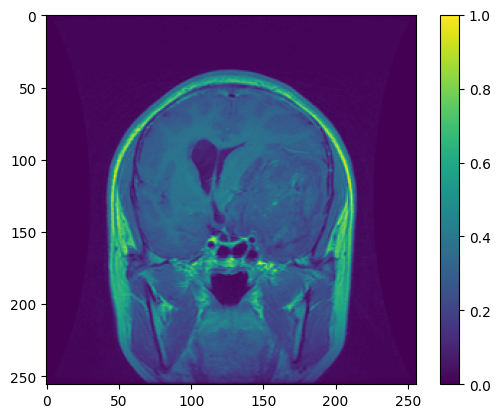

In [ ]:
# Normalized image preview 

fig,ax = plt.subplots()
cax = plt.imshow(X[0])
cbar = fig.colorbar(cax)
plt.show()

### 2.3.3 Train-Test Split
After the previous two steps, the data is split into two sets with 80% training (2,452 samples) and 20% testing (612 samples). 

In [ ]:
# Train/validation split (80:20)
test_idx = np.random.choice(X.shape[0], int(X.shape[0]*0.2), replace=False)

# Select validation dataset
X_test = X[test_idx]
y_test = y[test_idx]
Z_test = Z[test_idx]

# Exclude the validation dataset from the train dataset
idx = np.arange(0,X.shape[0])
idx_to_pick = np.isin(idx, test_idx) # Finding whether "val_idx" are present or not in "train_idx"
train_idx = ~idx_to_pick
X_train = X[train_idx]
y_train = y[train_idx]
Z_train = Z[train_idx]


In [ ]:
print(X_train.shape)
print(y_train.shape)
print(Z_train.shape)

(2452, 256, 256, 1)
(2452, 3)
(2452, 256, 256, 1)


Below shows the sample distribution across the training and testing sets.

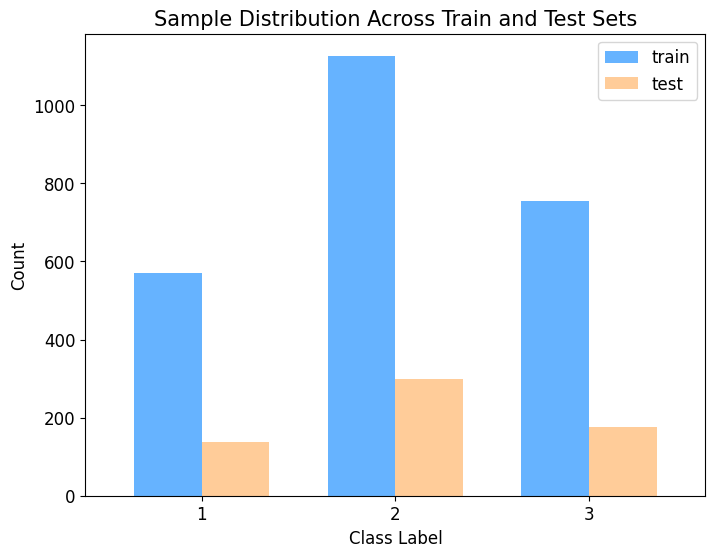

In [ ]:
# distribution of samples in train and test sets

_, train_counts = np.unique(onehot2list(y_train), return_counts=True)
_, test_counts = np.unique(onehot2list(y_test), return_counts=True)

counts=pd.DataFrame({'train': train_counts,'test': test_counts}, index=np.unique(labels))
ax=counts.plot(kind='bar',color=['#66b3ff','#ffcc99'],figsize=[8,6],fontsize=15,width=0.7)
ax.legend(fontsize=12)
ax.set_xlabel("Class Label",fontsize=12)
ax.set_ylabel("Count",fontsize=12)
ax.tick_params(labelsize=12,rotation=0)
ax.set_title("Sample Distribution Across Train and Test Sets",fontsize=15);

## 2.4 Class Imbalance
The dataset is imbalanced since there are 708 samples of meningioma tumor, 1,426 samples of glioma tumor, and 930 samples of pituitary tumor in total for training and testing sets combined. Since some labels have significantly fewer data than others, we applied over-sampling on the minority classes (i.e., meningioma tumor and pituitary tumor) on the training set. By duplicating a random subset of the data, each tumor type in the training set will contain 1,138 samples, as shown below. Since the test set is used for evaluating model performance and generalization to unseen data, over-sampling is not applied to the test set.

In [ ]:
# Function for oversampling

def oversample(X, y, Z):
  ids = []
  cnts = []
  for i in range(3):
    id = np.where(y[:,i] == 1)[0]
    ids.append(id)
    cnts.append(len(id))
  
  over_cnts = [max(cnts) - c for c in cnts]
  X_oversample = X
  Z_oversample = Z
  y_oversample = y
  for i in range(3):
    if over_cnts[i] > 0:
      choices = np.random.choice(ids[i], over_cnts[i])
      X_oversample = np.vstack((X_oversample, X[choices]))
      Z_oversample = np.vstack((Z_oversample, Z[choices]))
      y_oversample = np.vstack((y_oversample, y[choices]))
  return X_oversample, y_oversample,Z_oversample

Below is the sample distribution across train and test sets after rebalancing.

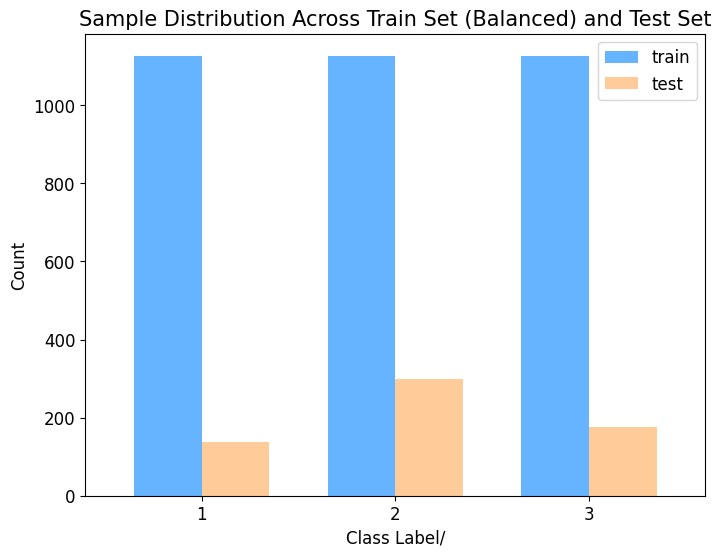

In [ ]:
# Visualize oversampled sample distribution

X_train_balanced, y_train_balanced, Z_train_balanced = oversample(X_train,y_train,Z_train)

_, train_counts = np.unique(onehot2list(y_train_balanced), return_counts=True) 
_, test_counts = np.unique(onehot2list(y_test), return_counts=True)

counts=pd.DataFrame({'train': train_counts,'test': test_counts}, index=np.unique(labels))

ax=counts.plot(kind='bar',color=['#66b3ff','#ffcc99'],figsize=[8,6],fontsize=15,width=0.7)
ax.legend(fontsize=12)
ax.set_xlabel("Class Label/",fontsize=12)
ax.set_ylabel("Count",fontsize=12)
ax.tick_params(labelsize=12,rotation=0)
ax.set_title("Sample Distribution Across Train Set (Balanced) and Test Set",fontsize=15);

In [ ]:
# Examine shapes
print(X_train_balanced.shape)
print(y_train_balanced.shape)
print(Z_train_balanced.shape)

(3381, 256, 256, 1)
(3381, 3)
(3381, 256, 256, 1)


## 2.5 Data Augmentation
To add variability to the data and prevent overfitting, data augmentation is also applied to the data using functions provided in the `albumentations` library. Several data augmentation techniques are included in the pipeline: RandomCrop(width=256, height=256), HorizontalFlip(p=0.5), VerticalFlip(p=0.5), and Rotate(limit=(-30,30), border_mode=cv2.BORDER_CONSTANT, value=0,p=0.5). A random patch with size 256x256 from an input image is extracted, with a probability of 50% the transform will flip the image horizontally and a probability of 50% the transform will flip the image vertically, and finally, the input image is rotated by a small angle (i.e., between -30 and 30) with a probability of 50%. Each input image is passed through the data augmentation pipeline once. Data from the original dataset without augmentation and data after augmentation are combined to form a single dataset. The final dataset contains 6,828 samples in total with 2,276 samples for each tumor type. The same data augmentation method applied to the brain tumor MRI images is also applied to the corresponding tumor masks data at the same time for consistency. 

In [ ]:
# Specify transformations 
transform = A.Compose([
    A.RandomCrop(width=256, height=256),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=(-30, 30), border_mode=cv2.BORDER_CONSTANT, value=0,p=0.5)
])

In [ ]:
# Augmentation

X_train_aug=[]
Z_train_aug=[]
y_train_aug=[]

for i in np.arange(X_train_balanced.shape[0]):
  transformed = transform(image=X_train_balanced[i], mask=Z_train_balanced[i])
  X_train_aug.append(transformed['image'])
  Z_train_aug.append(transformed['mask'])
  y_train_aug.append(y_train_balanced[i])

X_train_aug = np.vstack((np.asarray(X_train_aug),X_train_balanced))
Z_train_aug = np.vstack((np.asarray(Z_train_aug),Z_train_balanced))
y_train_aug = np.vstack((np.asarray(y_train_aug),y_train_balanced))

In [ ]:
# Shuffle after append augmented data

new_idx = np.random.choice(X_train_aug.shape[0],X_train_aug.shape[0],replace=False)
X_train_aug = X_train_aug[new_idx]
Z_train_aug = Z_train_aug[new_idx]
y_train_aug = y_train_aug[new_idx]

In [ ]:
# Print shapes of training data: X, y, Z

print(X_train_aug.shape)
print(y_train_aug.shape)
print(Z_train_aug.shape)

(6762, 256, 256, 1)
(6762, 3)
(6762, 256, 256, 1)


Below shows some examples of tumor images after augmentation with tumor masks superimposed.

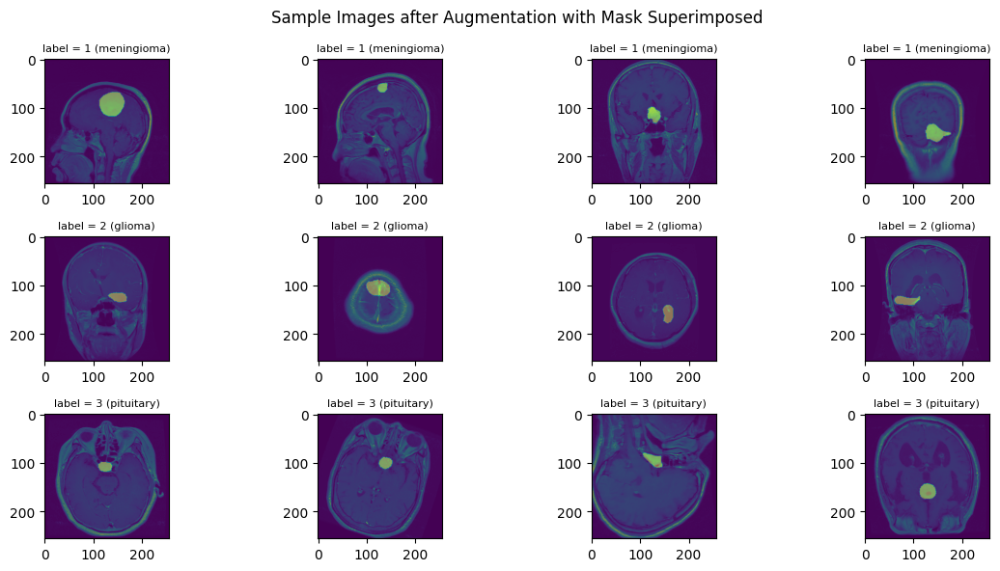

In [ ]:
# Preview augmented train set

ncols = 4
nrows = 3
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=[12, 6])

for j in np.arange(ncols):
    for i in np.arange(nrows):
      idx = np.array(range(len(y_train_aug)))
      idx = idx[np.array(onehot2list(y_train_aug)).reshape(-1)==(i+1)]
      idx_subsampled = np.random.choice(idx, ncols) 
      ax[i,j].imshow(X_train_aug[idx_subsampled[j]])
      ax[i,j].set_title(f"label = {onehot2list(y_train_aug)[idx_subsampled[j]]} ({idx_to_name[onehot2list(y_train_aug)[idx_subsampled[j]]]})",fontsize=8)
      ax[i,j].imshow(Z_train_aug[idx_subsampled[j]], alpha=0.4)
plt.subplots_adjust(wspace=0, hspace=0.1)
plt.suptitle('Sample Images after Augmentation with Mask Superimposed')
plt.tight_layout()

Below shows the sample distribution across the training and testing sets.

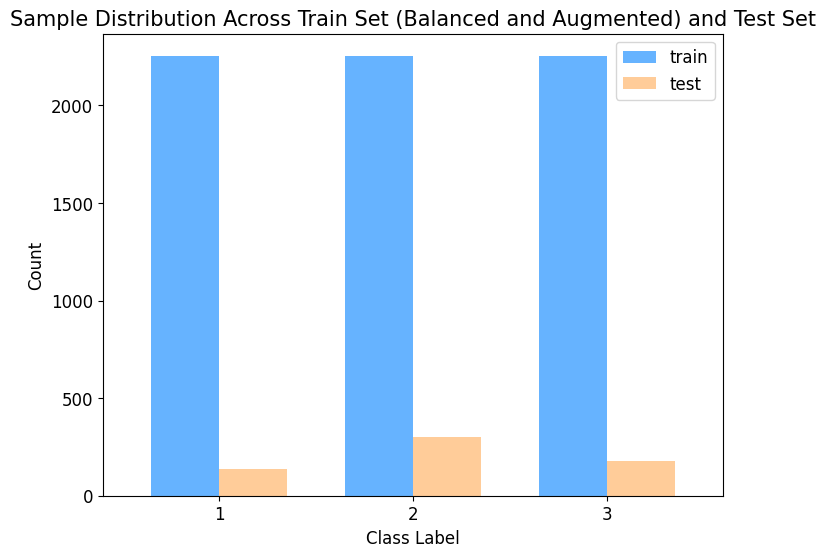

In [ ]:
# distribution of samples in train_aug and test sets

_, train_counts = np.unique(onehot2list(y_train_aug), return_counts=True)
_, test_counts = np.unique(onehot2list(y_test), return_counts=True)

counts=pd.DataFrame({'train': train_counts,'test': test_counts}, index=np.unique(labels))
ax=counts.plot(kind='bar',color=['#66b3ff','#ffcc99'],figsize=[8,6],fontsize=15,width=0.7)
ax.legend(fontsize=12)
ax.set_xlabel("Class Label",fontsize=12)
ax.set_ylabel("Count",fontsize=12)
ax.tick_params(labelsize=12,rotation=0)
ax.set_title("Sample Distribution Across Train Set (Balanced and Augmented) and Test Set",fontsize=15);

<a id="part3"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **3.0 Project Question**

<a id="part3"></a>

[Return to contents](#contents)

The first step in understanding the development of brain tumors is to identify and detect tumors in MRI scans of the brain. After preprocessing data, the final dataset has no missingness, is properly normalized, and is well-balanced, which is ready for model construction. All images are of size 256x256 with all pixel values ranging from 0 to 1, stored in NumPy arrays with data type of “float32”. The final dataset contains 6,930 samples in total with 2,310 samples for each of the 3 tumor types. The size of the dataset is large enough for us to build a model and perform classification tasks.

Since certain features of images may not be easily captured by human eyes and classifications can also be time-consuming, our main goal is to explore various neural network models (i.e., feedforward neural networks, convolutional neural networks) to **automatically classify between 3 types of brain tumors** from MRI scans. This can help provide diagnosis suggestions which can release healthcare workers from spending time reading MRI scans so that they can spend more time on patients. The secondary goal of the project is to **detect and segment the tumor from the MRI scans**. This can be useful for pinpointing the exact location of the tumor for supporting physicians’ decisions in making treatment plans for the patients. 

<a id="part4"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **4.0 Baseline Classification Model: FFNN**

<a id="part4"></a>

[Return to contents](#contents)

## 4.1 FFNN Architecture
For the baseline model, we have decided to use a Feed-Forward Neural Network (FFNN). In our model architecture, we use two hidden layers, each with 256 units. We used `relu` as the activation for hidden layers to allow non-linearity. Finally, we use `softmax` as the activation function for the output layer to assign probabilities for each class (meningioma, glioma, and pituitary). The data we used are the balanced and augmented data stored in `X_train_aug` and `y_train_aug`. 20% of the training data was used as the validation set. Moreover, since we are doing classification tasks, the metrics we used to assess model performance is accuracy. Given the large amount of training data and trainable parameters, the training process of the model is time-consuming so we trained the model for 10 epochs with a batch size of 32.

In [ ]:
# Build FFNN model

def model_FFNN(input_shape, output_dim):
  model = Sequential(name="ffnn_model")
  model.add(Dense(256, input_shape=input_shape, activation="relu"))
  model.add(Dense(256, input_shape=input_shape, activation="relu"))
  model.add(Dense(output_dim, activation="softmax"))
  return model

X_train_aug_flattened = X_train_aug.reshape((X_train_aug.shape[0],-1))
n = X_train_aug.shape[1]

model1 = model_FFNN(input_shape=(n*n,), output_dim=y_train_aug.shape[1])
model1.compile(loss="categorical_crossentropy", optimizer="Adam", metrics=["accuracy"])

In [ ]:
# Train the model
start = time.time()
history1 = model1.fit(X_train_aug_flattened , y_train_aug, epochs=10, batch_size=32, validation_split=0.2)
end = time.time()

Epoch 1/10
171/171 [==============================] - 4s 14ms/step - loss: 1.1731 - accuracy: 0.6078 - val_loss: 0.7920 - val_accuracy: 0.6149
Epoch 2/10
171/171 [==============================] - 2s 9ms/step - loss: 0.6525 - accuracy: 0.7023 - val_loss: 0.7039 - val_accuracy: 0.6523
Epoch 3/10
171/171 [==============================] - 2s 9ms/step - loss: 0.5619 - accuracy: 0.7481 - val_loss: 0.5361 - val_accuracy: 0.7716
Epoch 4/10
171/171 [==============================] - 2s 9ms/step - loss: 0.4775 - accuracy: 0.7948 - val_loss: 0.5127 - val_accuracy: 0.7848
Epoch 5/10
171/171 [==============================] - 2s 9ms/step - loss: 0.4654 - accuracy: 0.7964 - val_loss: 0.5080 - val_accuracy: 0.7811
Epoch 6/10
171/171 [==============================] - 2s 9ms/step - loss: 0.3815 - accuracy: 0.8319 - val_loss: 0.4778 - val_accuracy: 0.8089
Epoch 7/10
171/171 [==============================] - 2s 9ms/step - loss: 0.3436 - accuracy: 0.8614 - val_loss: 0.5104 - val_accuracy: 0.7914
Epoch

In [ ]:
# Print training time
print('FFNN model took : {} seconds to run!'.format(round((end-start))))

FFNN model took : 13 seconds to run!


In [ ]:
# Print summary of FFNN model
model1.summary()

Model: "ffnn_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 256)               16777472  
                                                                 
 dense_6 (Dense)             (None, 256)               65792     
                                                                 
 dense_7 (Dense)             (None, 3)                 771       
                                                                 
Total params: 16,844,035
Trainable params: 16,844,035
Non-trainable params: 0
_________________________________________________________________


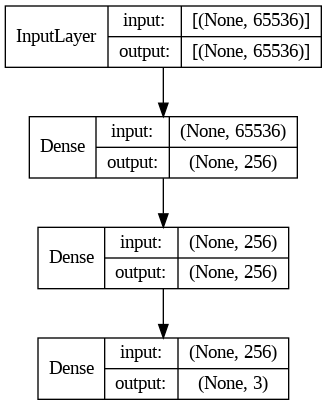

In [ ]:
# Illustrate the FFNN model
tf.keras.utils.plot_model(model1, show_shapes=True, show_layer_names=False)

## 4.2 Training and Validation Loss of FFNN
We observed that training and validation loss flatten after the 8th epoch, which is a good sign that we trained it long enough, and it has converged. 

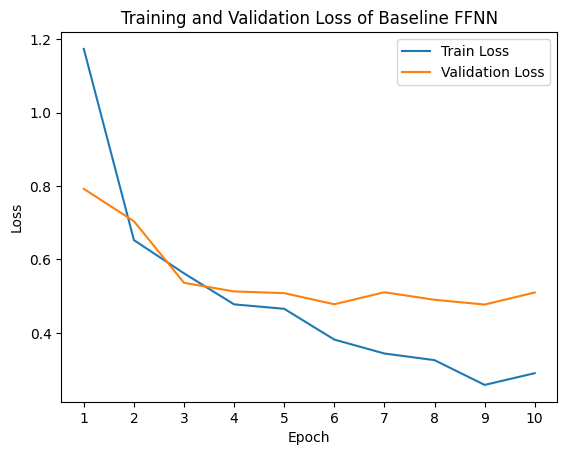

In [ ]:
#  Visualization: Plot training and validation loss

plt.plot(range(1,11), history1.history['loss'], label='Train Loss')
plt.plot(range(1,11), history1.history['val_loss'], label='Validation Loss')
plt.xticks(range(1,11))
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title("Training and Validation Loss of Baseline FFNN")
plt.legend()
plt.show()

## 4.3 Training and Validation Accuracy of FFNN
We observed that training and validation accuracy flatten after the 8th epoch, which is a good sign that we trained it long enough, and it has converged. 

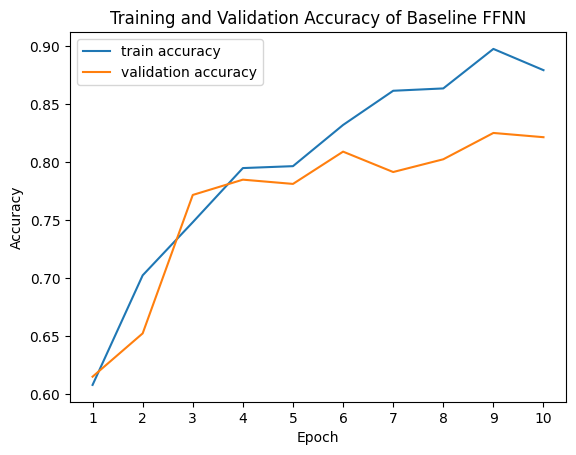

In [ ]:
#  Visualization: Plot training and validation accuracy

plt.plot(range(1,11), history1.history['accuracy'], label='train accuracy')
plt.plot(range(1,11), history1.history['val_accuracy'], label='validation accuracy')
plt.xticks(range(1,11))
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title("Training and Validation Accuracy of Baseline FFNN")
plt.legend()
plt.show()

## 4.4 Confusion Matrix for FFNN
Looking at the confusion matrix gives us a bigger picture of the result. We found that the FFNN model performs better on the classification of type 2 (glioma) and 3 (pituitary) of the tumor (with 88.89% and 96.28% accuracy, respectively). However, it seems to have more difficulty identifying the type 1 brain tumor (58.82% accuracy). This indicates that there may be some features of type 1 tumor that are not easily captured by our model. 

In [ ]:
# Generate confusion matrix
def confusion_matrix(y_label, y_pred):
  classes = np.unique(y_label)
  num_classes = len(classes)
  cm = np.zeros((num_classes, num_classes)).astype('int')
  for i in range(len(y_label)):
    true_class = np.where(classes == y_label[i])[0]
    pred_class = np.where(classes == y_pred[i])[0]
    cm[true_class, pred_class] += 1
  return cm

# Visualize confusion matrix
def plot_confusion_matrix(y_label, y_pred, title='Confusion matrix'):
  classes = np.unique(y_label)
  num_classes = len(classes)
  confusion_mx = confusion_matrix(y_label, y_pred)

  cm_normalized = confusion_mx.astype('float') / confusion_mx.sum(axis=1)[:, np.newaxis]

  fig, ax = plt.subplots()
  im = ax.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    
  ax.figure.colorbar(im, ax=ax)
  ax.set(xticks=np.arange(num_classes),
         yticks=np.arange(num_classes),
         xticklabels=['1', '2', '3'],
         yticklabels=['1', '2','3'],
         title=title,
         ylabel='True label',
         xlabel='Predicted label')
  ax.yaxis.set_tick_params(rotation=90)

  thresh = cm_normalized.max() / 2.0
  for i in range(num_classes):
      for j in range(num_classes):
          ax.text(j, i, format(cm_normalized[i, j], '.2%'),
                  ha='center', va='center',
                  color='white' if cm_normalized[i, j] > thresh else 'black')
          ax.text(j, i+0.2, confusion_mx[i,j],
                  ha='center', va='center',
                  color='white' if cm_normalized[i, j] > thresh else 'black')
  fig.tight_layout()

  fig.tight_layout()
  plt.show()

20/20 [==============================] - 0s 4ms/step


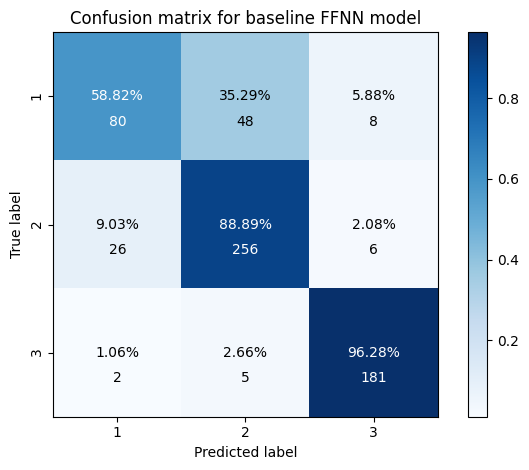

In [ ]:
# Predict on test set
y_pred_probas =  model1.predict(X_test.reshape((X_test.shape[0],-1)))
y_pred = np.argmax(y_pred_probas,axis =1) + 1 #class label starts with one

# Plot confusion matrix
plot_confusion_matrix(onehot2list(y_test), y_pred, title='Confusion matrix for baseline FFNN model')

## 4.5 Test Accuracy of FFNN
Finally, we evaluated our baseline model using the test set. Overall, it achieved a test accuracy of 0.8448, which is good. However, the confusion matrix suggests that the model has poor performance on classifying type 1 tumor. Overall, there is still room for improvement in terms of test accuracy. Building a more complex FFNN model or CNN model later may solve this issue. 

In [ ]:
# Test accuracy 

_, acc = model1.evaluate(X_test.reshape((X_test.shape[0],-1)), y_test)
print('Test accuracy:', acc)

20/20 [==============================] - 0s 5ms/step - loss: 0.3643 - accuracy: 0.8448
Test accuracy: 0.8447712659835815


<a id="part5"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **5.0 Advanced Classification Model: CNN**

<a id="part5"></a>

[Return to contents](#contents)

## 5.1 CNN Architecture
To improve on the task of classifying different brain tumors, Convolutional Neural Networks (CNNs) can be used. There are several advantages of using CNNs over FFNNs, including that CNNs allow for weight sharing that can prevent overfitting, CNNs contain convolutional layers for better detection of different patterns in image data (e.g., lines, shapes), and CNNs contain pooling layers for improving the efficiency of the network while preserving the most important features. Different CNN model architectures can be explored to find the best CNN model for our problem of interest. This means exploring different numbers of convolutional and pooling layers, as well as using different filter sizes and stride sizes. Various learning rates can also be explored. Regularization techniques such as dropout can be applied to prevent overfitting and improve generalization. For comparison, the same methods used to evaluate the performance of the baseline FFNN model were applied to evaluate the improved CNN model (i.e.,  accuracy, loss, and confusion matrix).

Our model consists of four sets of one convolution layer each followed by a max-pooling layer. After the last max-pooling layer, one flatten layer, one dense layer, one dropout layer (with a dropout rate of 0.3), followed by the output dense layer. The activation function for the output layer is again `softmax` because this is a multi-class classification problem. The activation function for the hidden layer is `relu` to introduce nonlinearity. Given the large amount of training data and trainable parameters, the training process of the model is time-consuming so we trained the model for 10 epochs with a batch size of 64. 20% of the training data is used as the validation set for better training. To prevent overfitting, early stopping with a patience of 3 is applied to monitor the performance of the model on the validation set. Training is stopped early when the performance starts to worsen on the validation set and the best weights learned by the model are restored as the final output. 

In [ ]:
# Define the CNN model

input_shape = X_train_aug.shape[1:]
output_dim = y_train_aug.shape[1]
filter_dim = 32

def model_CNN(input_shape, filter_dim, output_dim, p=0.3):

    inputs = Input(input_shape)

    x = Conv2D(filter_dim, (3, 3), padding="same", activation="relu")(inputs)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(filter_dim, (3, 3), padding="same", activation="relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(filter_dim, (3, 3), padding="same", activation="relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(filter_dim, (3, 3), padding="same", activation="relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Flatten()(x)

    x = Dense(1024, activation="relu")(x)
    x = Dropout(p)(x)

    outputs = Dense(output_dim, activation="softmax")(x)
    model = Model(inputs=inputs, outputs=outputs, name="cnn_model")
    return model

# Build the CNN model
model2 = model_CNN(input_shape, filter_dim, output_dim)
model2.summary()

Model: "cnn_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 256, 256, 1)]     0         
                                                                 
 conv2d_96 (Conv2D)          (None, 256, 256, 32)      320       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 128, 128, 32)     0         
 2D)                                                             
                                                                 
 conv2d_97 (Conv2D)          (None, 128, 128, 32)      9248      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 conv2d_98 (Conv2D)          (None, 64, 64, 32)        92

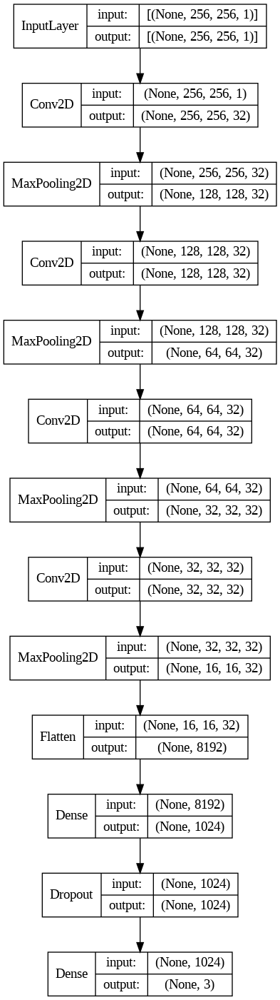

In [ ]:
# Compile and visualize the model
model2.compile(loss="categorical_crossentropy", optimizer="Adam", metrics=["accuracy"])
tf.keras.utils.plot_model(model2, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
start=time.time()
epochs = 10
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)
history2 = model2.fit(X_train_aug, y_train_aug, epochs=epochs, batch_size=64, callbacks = [early_stopping], validation_split=0.2)
end=time.time()

Epoch 1/10
85/85 [==============================] - 16s 34ms/step - loss: 0.7283 - accuracy: 0.6482 - val_loss: 0.5503 - val_accuracy: 0.7746
Epoch 2/10
85/85 [==============================] - 2s 20ms/step - loss: 0.4815 - accuracy: 0.7903 - val_loss: 0.4079 - val_accuracy: 0.8248
Epoch 3/10
85/85 [==============================] - 2s 20ms/step - loss: 0.3232 - accuracy: 0.8706 - val_loss: 0.3132 - val_accuracy: 0.8721
Epoch 4/10
85/85 [==============================] - 2s 20ms/step - loss: 0.2126 - accuracy: 0.9198 - val_loss: 0.2491 - val_accuracy: 0.9032
Epoch 5/10
85/85 [==============================] - 2s 20ms/step - loss: 0.1487 - accuracy: 0.9412 - val_loss: 0.2428 - val_accuracy: 0.8958
Epoch 6/10
85/85 [==============================] - 2s 20ms/step - loss: 0.1019 - accuracy: 0.9612 - val_loss: 0.2562 - val_accuracy: 0.9135
Epoch 7/10
85/85 [==============================] - 2s 21ms/step - loss: 0.0531 - accuracy: 0.9806 - val_loss: 0.2466 - val_accuracy: 0.9231
Epoch 8/10
8

In [ ]:
# Print training time
print('CNN model took : {} seconds to run!'.format(round((end-start))))

CNN model took : 27 seconds to run!


## 5.2 Training and Validation Loss of CNN
We observed that training and validation loss flatten after the 6th epoch, which is a good sign that we trained it long enough, and it has converged. 

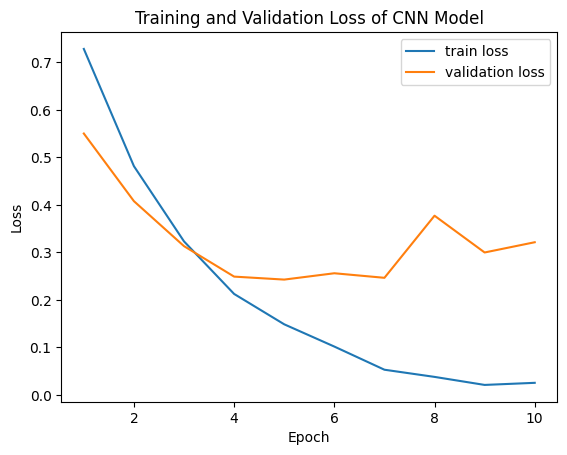

In [ ]:
#  Visualization: Plot training and validation loss

plt.plot(range(1,epochs+1), history2.history['loss'], label='train loss')
plt.plot(range(1,epochs+1), history2.history['val_loss'], label='validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title("Training and Validation Loss of CNN Model")
plt.legend()
plt.show()

## 5.3 Training and Validation Accuracy of CNN
We observed that training and validation accuracy flatten after the 6th epoch, which is a good sign that we trained it long enough, and it has converged. 

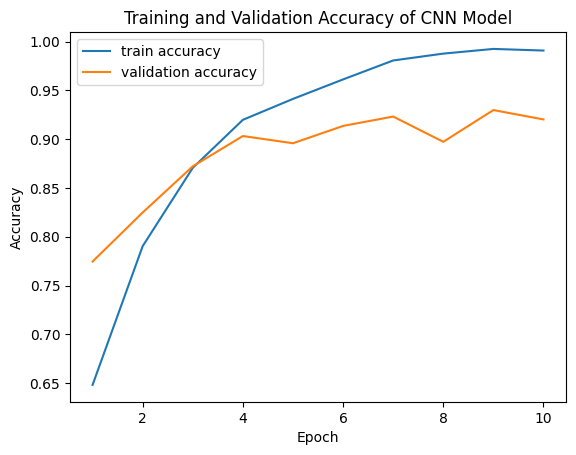

In [ ]:
#  Visualization: Plot training and validation accuracy

plt.plot(range(1,epochs+1), history2.history['accuracy'], label='train accuracy')
plt.plot(range(1,epochs+1), history2.history['val_accuracy'], label='validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title("Training and Validation Accuracy of CNN Model")
plt.legend()
plt.show()

## 5.4 Confusion Matrix for CNN
Examining the confusion matrix, we can see that accuracy scores for all three classes are now above 92%. Recall that our baseline FFNN model seems to have difficulty identifying the type 2 brain tumor (glioma). This result shows that our advanced model is able to capture the essential information for all 3 types of tumors and has much improvement over the FFNN model.

20/20 [==============================] - 0s 9ms/step


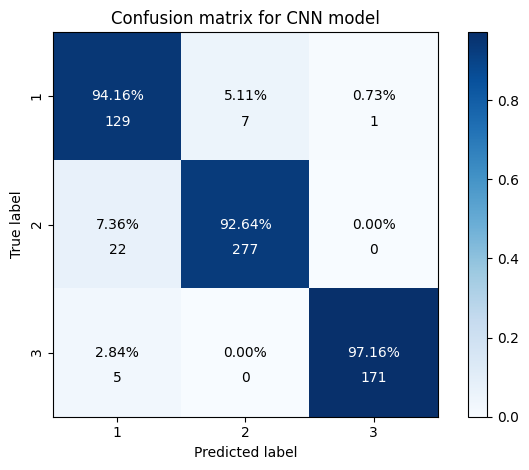

In [ ]:
# Confusion matrix

y_pred_probas =  model2.predict(X_test)
y_pred = np.argmax(y_pred_probas, axis = 1) + 1 #class label starts with one
plot_confusion_matrix(onehot2list(y_test), y_pred, title='Confusion matrix for CNN model')

## 5.5 Test Accuracy of CNN
This time, evaluating our CNN model using the test set, it achieved a test accuracy of 0.9428, which is more than 10% higher than the result obtained from the FFNN model. This reaffirms our expectation that CNN will perform better than FFNN on this data.

In [ ]:
# test accuracy 

_, acc = model2.evaluate(X_test, y_test)
print('Test accuracy:', acc)

20/20 [==============================] - 0s 6ms/step - loss: 0.2452 - accuracy: 0.9428
Test accuracy: 0.9428104758262634


<a id="part6"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **6.0 CNN Model Visualization: Activation Maps and Saliency Maps**

<a id="part6"></a>

[Return to contents](#contents)

To interpret the CNN models, we also produced some visualizations by identifying the pixels that have the highest impact on the classification of the MRI images. Specifically, activation maps, SmoothGrad saliency maps, and Grad-CAM saliency heat maps are generated. These visualizations help us understand the areas of images that have the most significant contributions in making the final classification decision. Below shows the activation maps of the intermediate layers for a correctly labeled sample and an incorrectly labeled sample. The SmoothGrad saliency maps and Grad-CAM saliency heat maps for a correctly labeled sample and an incorrectly labeled sample are also shown below.

One major observation is that for the correctly labeled sample, some activation layers appear to learn the brain architecture along with the tumor while there is one intermediate layer that learned the brain architecture without the tumor (rightmost image on the second row). For the incorrectly labeled sample, the intermediate layers have never learned the brain architecture without the tumor. It is possible that having intermediate layers separating the brain with the tumor and the brain without the tumor contributes to better classification ability.

The SmoothGrad saliency map for the correctly labeled sample appears to highlight the tumor slightly better than the SmoothGrad saliency map for the incorrectly labeled sample. However, overall, SmoothGrad does not show a lot of differences in colors in the brain. The Grad-CAM saliency heat maps appear to be better at highlighting specific areas of focus (i.e., red and yellow regions) as opposed to areas that are not so important (i.e., dark blue regions). The tumor is highlighted in yellow for the correctly labeled sample whereas the tumor remains to be in dark blue for the incorrectly labeled sample. These visualizations demonstrate that being able to focus on the important parts of the image for identifying the object of interest improves the model's performance. 

## 6.1 Helper Functions to Generate Activation Maps, SmoothGrad Saliency Maps, and Grad-CAM Saliency Heatmaps.

In [ ]:
# A helper function to generate activation maps

def get_activation_maps(model, layer_id, input_image):
    """Returns intermediate output (activation map) from passing
    an image to the model
    
    Parameters:
        model (tf.keras.Model): Model to examine
        layer_id (int): Which layer's (from zero) output to return
        input_image (ndarray): The input image
    Returns:
        maps (List[ndarray]): activation map stacked output by the
        specified layer
    """
    model_ = Model(
        inputs=[model.input], outputs=[model.layers[layer_id].output]
    )
    return model_.predict(
        np.expand_dims(input_image, axis=0)
    )[0,:,:,:].transpose((2,0,1))

In [ ]:
# A helper function to generate SmoothGrad saliency maps

def generate_saliency_map(model, img, class_index, smooth_samples=0):
    saliency = Saliency(model,model_modifier=ReplaceToLinear())
    score = CategoricalScore([class_index])
    saliency_map = saliency(score, img, smooth_samples)
    return saliency_map

In [ ]:
# A helper function to generate Grad-CAM saliency heat maps

def generate_gradcam(model, img, class_index):
    gradcam = Gradcam(model,model_modifier=ReplaceToLinear())
    score = CategoricalScore([class_index])
    gradcam_results = gradcam(score, img)
    return gradcam_results

## 6.2 Visualizations of Correctly Labeled Sample

In [ ]:
# randomly select a correctly classified image

np.random.seed(209)

y_pred_probas = model2.predict(X_test)
y_pred = np.argmax(y_pred_probas, axis = 1) + 1 #class label starts with one

idx = np.array(np.where(y_pred==onehot2list(y_test))).reshape(-1)

random_sampled_idx = np.random.choice(idx, 1)[0]
print(random_sampled_idx)

20/20 [==============================] - 0s 11ms/step
134


1/1 [==============================] - 0s 37ms/step


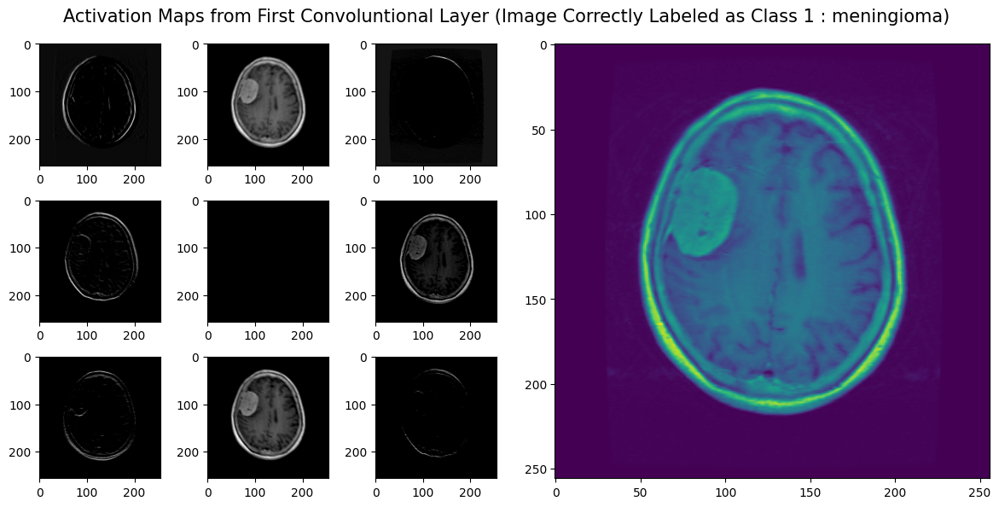

In [ ]:
# plot the activation maps

layer_id = 1

fig, axes = plt.subplots(ncols=6, nrows=3,figsize=[12,6])
gs = axes[0, 3].get_gridspec()

for ax in axes[:, 3:]:
    for a in ax:
        a.remove()
    
axbig = fig.add_subplot(gs[:, 3:])

for i, ax in enumerate(np.ravel(axes[:, :3])):
  ax.imshow(get_activation_maps(model2, layer_id, X_test[random_sampled_idx])[i], cmap='gray')

axbig.imshow(X_test[random_sampled_idx])
correct_label = onehot2list(y_test)[random_sampled_idx]
fig.suptitle(f'Activation Maps from First Convoluntional Layer (Image Correctly Labeled as Class {correct_label} : {idx_to_name[correct_label]})',
            fontsize=15)

plt.tight_layout()
plt.show()

In [ ]:
# Generate maps by calling helper functions

from tf_keras_vis.utils.model_modifiers import ReplaceToLinear

target_class_idx = onehot2list(y_test)[random_sampled_idx]-1
img_array = X_test[random_sampled_idx].reshape(256,256,1)

saliency_map = generate_saliency_map(model2, img_array, target_class_idx, smooth_samples=40)
saliency_map = normalize(saliency_map)

gradcam_results = generate_gradcam(model2,img_array, target_class_idx)
gradcam_results = normalize(gradcam_results)

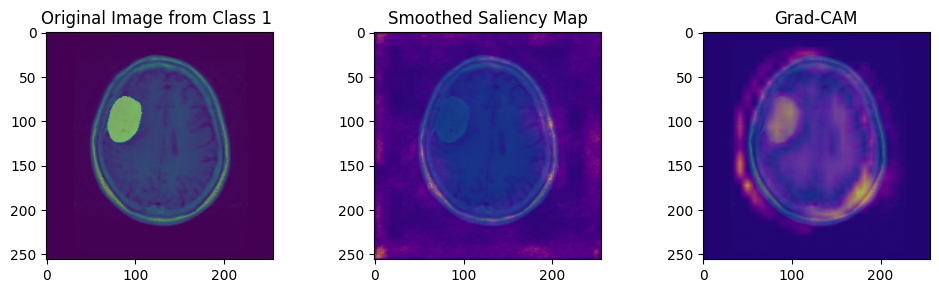

In [ ]:
# visualize saliency maps

fig, ax = plt.subplots(1, 3, figsize=(10, 3))

ax[0].imshow(img_array) 
ax[0].imshow(Z_test[random_sampled_idx],alpha = 0.4) 
ax[0].set_title(f'Original Image from Class {correct_label} ')

ax[1].imshow(img_array) 
ax[1].imshow(saliency_map[0], cmap='plasma', alpha=0.6)
ax[1].set_title('Smoothed Saliency Map')

ax[2].imshow(img_array)
ax[2].imshow(gradcam_results[0], cmap='plasma', alpha=0.6)
ax[2].set_title('Grad-CAM')

plt.tight_layout()
plt.show()

## 6.3 Visualizations of Incorrectly Labeled Sample

In [ ]:
# randomly select a incorrectly classified image

np.random.seed(209)
idx = np.array(np.where(y_pred != onehot2list(y_test))).reshape(-1)
random_sampled_idx = np.random.choice(idx, 1)[0]


1/1 [==============================] - 0s 41ms/step


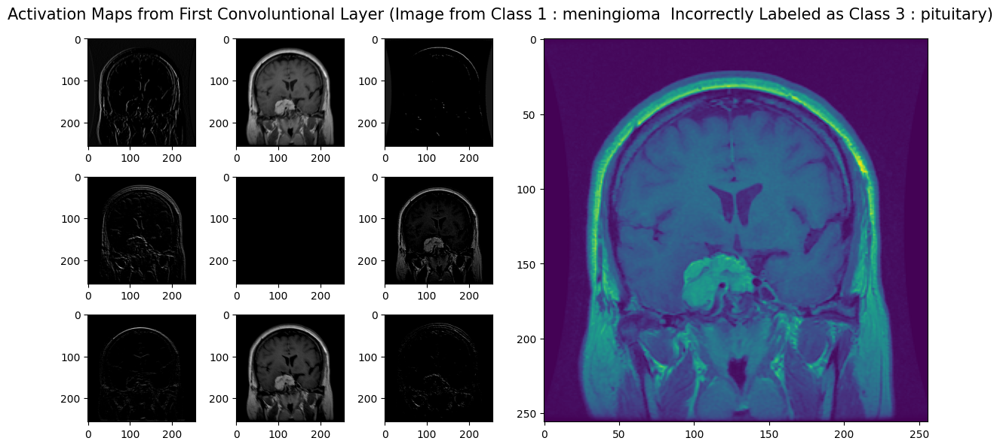

In [ ]:
# plot the activation maps

layer_id = 1

fig, axes = plt.subplots(ncols=6, nrows=3,figsize=[12,6])
gs = axes[0, 3].get_gridspec()

for ax in axes[:, 3:]:
    for a in ax:
        a.remove()
    
axbig = fig.add_subplot(gs[:, 3:])

for i, ax in enumerate(np.ravel(axes[:, :3])):
  ax.imshow(get_activation_maps(model2, layer_id, X_test[random_sampled_idx])[i], cmap='gray')

axbig.imshow(X_test[random_sampled_idx])

correct_label = onehot2list(y_test)[random_sampled_idx]
pred_label =  y_pred[random_sampled_idx]

fig.suptitle(f'Activation Maps from First Convoluntional Layer (Image from Class {correct_label} : {idx_to_name[correct_label]}  Incorrectly Labeled as Class {pred_label} : {idx_to_name[pred_label]})',
            fontsize=15)

plt.tight_layout()
plt.show()

In [ ]:
# Generate maps by calling helper functions

target_class_idx = onehot2list(y_test)[random_sampled_idx]-1
img_array = X_test[random_sampled_idx].reshape(256,256,1)

saliency_map = generate_saliency_map(model2, img_array, target_class_idx, smooth_samples=30)
saliency_map = normalize(saliency_map)

gradcam_results = generate_gradcam(model2,img_array, target_class_idx)
gradcam_results = normalize(gradcam_results)

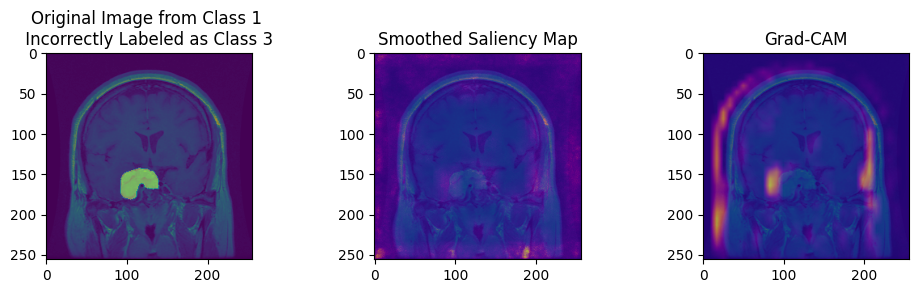

In [ ]:
# visualize saliency maps

fig, ax = plt.subplots(1, 3, figsize=(10, 3))

ax[0].imshow(img_array) 
ax[0].imshow(Z_test[random_sampled_idx],alpha = 0.4) 
ax[0].set_title(f'Original Image from Class {correct_label} \n Incorrectly Labeled as Class {pred_label} ')

ax[1].imshow(img_array) 
ax[1].imshow(saliency_map[0], cmap='plasma', alpha=0.6)
ax[1].set_title('Smoothed Saliency Map')

ax[2].imshow(img_array)
ax[2].imshow(gradcam_results[0], cmap='plasma', alpha=0.6)
ax[2].set_title('Grad-CAM')

plt.tight_layout()
plt.show()

<a id="part7"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **7.0 Baseline Tumor Detection and Segmentation: UNet**

<a id="part7"></a>

[Return to contents](#contents)

In addition to improving the performance of the tumor type classification task, the secondary objective of the project is to detect and segment tumors from brain MRI images. Accurately segmenting tumors from MRI scan images has several medical significance, including supporting physicians in making accurate diagnoses of diseases, making treatment plans, monitoring the effectiveness of treatments, and providing useful information for medical research. This can also be helpful for understanding disease progression and informing future directions in medical research.

During evaluation of the segmentation, we noticed that the model was classifying all pixels as zeros to achieve a high accuracy, which is not an accurate way of learning. This was due to the fact that our binary segmentation had a zeros to ones ratio of around 59:1, resulting in a significant imbalance. To address this issue, we modified the loss function used. We used a weighted binary cross-entropy (BCE) loss function that gives more importance to the less frequent class (ones in our case). This encouraged the model to learn to predict both classes instead of just one dominant. 

In [ ]:
"""reference from 
https://datascience.stackexchange.com/questions/58735/weighted-binary-cross-entropy-loss-keras-implementation"""

# Compute the ratio of zeros to ones
pos_weight = np.round(np.sum(Z_train==0)/np.sum(Z_train==1), 2)
print(pos_weight)

# Define a customized weighted BCE loss function
from tensorflow.python.keras import backend as K
def weighted_BCE_loss(y_true, y_pred, positive_weight=pos_weight):
    # y_true: (None,None,None,None)     y_pred: (None,256,256,1)
    y_pred = K.clip(y_pred, min_value=1e-12, max_value=1 - 1e-12)
    weights = K.ones_like(y_pred)  # (None,256,256,1)
    weights = tf.where(y_pred < 0.5, positive_weight * weights, weights)
    # weights[y_pred<0.5]=positive_weight
    out = keras.losses.binary_crossentropy(y_true, y_pred)  # (None,256,256)
    out = K.expand_dims(out, axis=-1) * weights  # (None,256,256,1)* (None,256,256,1)
    return K.mean(out)

59.63


Intersection-over-union (IoU) and DICE are used as performance metrics to evaluate the model. IoU is the intersection-over-union which measures the percentage of overlap between `y_true` (i.e., the ground truth segmentation) and `y_pred` (i.e., the predicted segmentation). It is calculated by *(`y_true` intersect `y_pred`) / (`y_true` union `y_pred`)*. The mean of DICE measures the similarity between the true and predicted segmentations across all pixels, meaning that it measures the ground truth and predicted segmentations both in terms of the total number of pixels and the spatial location of the segmentations on the image. It is calculated by *2 * overlap / total number of pixels = 2 * (`y_true` intersect `y_pred`) / (|`y_true`| + |`y_pred`|)*, with |`y_true`| and |`y_pred`| be the number of pixels of `y_true` and `y_pred`, respectively. Both IoU and mean of DICE range from 0 to 1. 

In [ ]:
# Define the IOU performance measure
def intersection_over_union(y_true, y_pred):
    intersection = np.sum(np.abs(y_true * y_pred))
    sum_ = np.sum(np.abs(y_true) + np.abs(y_pred))
    if (sum_ - intersection) == 0:
        jac = 0
    else: 
        jac = (intersection ) / (sum_ - intersection)
    return jac

In [ ]:
# Define the DICE performance measure
def DICE(y_true, y_pred):
    # your code here
    intersection = np.sum(np.abs(y_true * y_pred))
    n_pixels = np.sum(np.abs(y_true) + np.abs(y_pred))
    if n_pixels == 0:
        return 0
    else: 
        return 2*intersection / n_pixels

## 7.1 UNet Architecture
The UNet consists of an encoder and a decoder and its architecture is characterized by skip connections. These skip connections allow for more effective gradient flow and preserve spatial information learned in earlier layers. Specifically, the UNet uses location information from the downsampling path of the encoder and contextual information in the upsampling path by the skip connections. UNet has been successfully applied to many image segmentation problems, and therefore, we believe that it would be a suitable baseline model to use for our tumor detection and segmentation task.

Initially, we attempted to implement the classic UNet architecture. However, we found that the model had over ten million trainable parameters as our image size is (256,256), making the training process time-consuming and computationally expensive. Therefore, we decided to utilize transfer learning by including the pretrained ResNet50 model trained on the ImageNet dataset as our encoder. This allowed us to significantly reduce the number of trainable parameters and limit them to only the decoder part of the UNet model. Notice that the pretrained ResNet50 requires three channels, whereas our dataset only had one channel. To address this issue, we made two copies of the existing pixel set and created two additional channels with these copies. For the decoder, we included four upsampling blocks. `sigmoid` activation is applied at the end since this is a binary segmentation problem. Given the large amount of training data and trainable parameters, the training process of the model is time-consuming so we trained the model for 15 epochs with a batch size of 32. To prevent overfitting, we used 20% of the data as validation and applied early stopping with a patience of 3. 

In [ ]:
# Add channels to apply the pretrained RGB Unet
X_train_aug_RGB = np.repeat(X_train_aug, 3, axis=3)

In [ ]:
# A helper function that generates upsample block
def upsample_block(inputs, skip_inputs, filters):
    upsample = layers.Conv2DTranspose(filters, 2, strides=(2, 2), padding="same")(inputs)
    skip_inputs = layers.Conv2D(filters, 1, activation="relu")(skip_inputs)  # add a 1x1 convolution layer to match channel dimension
    concat = layers.concatenate([skip_inputs, upsample])
    conv1 = layers.Conv2D(filters, 3, activation="relu", padding="same", kernel_initializer="he_normal")(concat)
    return conv1

# Define the UNet model
def build_unet_model(input_shape=(256, 256, 3)):
    # load pre-trained ResNet50 model without top layers
    encoder = applications.ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    encoder_output = encoder.output
    
    # middle
    conv = layers.Conv2D(256, 3, activation="relu", padding="same", kernel_initializer="he_normal")(encoder_output)
    conv = layers.Conv2D(256, 3, activation="relu", padding="same", kernel_initializer="he_normal")(conv)
    
    # decoder: expansive path - upsample
    # 4 - upsample
    u4 = upsample_block(conv, encoder.get_layer('conv4_block6_out').output, 256)
    # 3 - upsample
    u3 = upsample_block(u4, encoder.get_layer('conv3_block4_out').output, 128)
    # 2 - upsample
    u2 = upsample_block(u3, encoder.get_layer('conv2_block3_out').output, 64)
    # 1 - upsample
    u1 = upsample_block(u2, encoder.get_layer('conv1_relu').output, 32)
    
    up0 = keras.layers.UpSampling2D()(u1)
    conv0 = keras.layers.Conv2D(filters=2, kernel_size=3, padding='same', activation='relu', kernel_initializer="he_normal")(up0)
    
    # output
    outputs = layers.Conv2D(1, 1, activation="sigmoid")(conv0)
    
    # freeze the encoder layers
    for layer in encoder.layers:
        layer.trainable = False
    
    model = models.Model(inputs=encoder.input, outputs=outputs, name="UNet_model")
    return model

In [ ]:
# Build the UNet model
unet_model = build_unet_model()
unet_model.summary()

Model: "UNet_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_6[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                         

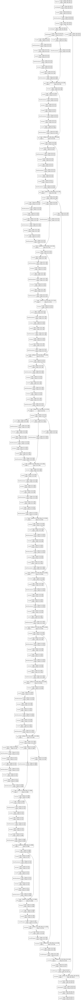

In [ ]:
# Define the optimizer
learning_rate=0.001
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

# Compile and visualize the model
unet_model.compile(optimizer = optimizer, loss=weighted_BCE_loss, metrics=['accuracy'])
tf.keras.utils.plot_model(unet_model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the unet model
start=time.time()
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)
history = unet_model.fit(X_train_aug_RGB, Z_train_aug, batch_size=32, epochs=15, callbacks = [early_stopping], validation_split=0.2)
end=time.time()

Epoch 1/15
174/174 [==============================] - 21s 68ms/step - loss: 3.8504 - accuracy: 0.9836 - val_loss: 3.6960 - val_accuracy: 0.9842
Epoch 2/15
174/174 [==============================] - 10s 56ms/step - loss: 3.4785 - accuracy: 0.9840 - val_loss: 3.4717 - val_accuracy: 0.9842
Epoch 3/15
174/174 [==============================] - 10s 55ms/step - loss: 3.2986 - accuracy: 0.9840 - val_loss: 3.3231 - val_accuracy: 0.9842
Epoch 4/15
174/174 [==============================] - 10s 56ms/step - loss: 2.9691 - accuracy: 0.9843 - val_loss: 2.7948 - val_accuracy: 0.9850
Epoch 5/15
174/174 [==============================] - 10s 56ms/step - loss: 2.4759 - accuracy: 0.9861 - val_loss: 2.4142 - val_accuracy: 0.9867
Epoch 6/15
174/174 [==============================] - 10s 56ms/step - loss: 2.3173 - accuracy: 0.9868 - val_loss: 2.3446 - val_accuracy: 0.9871
Epoch 7/15
174/174 [==============================] - 10s 56ms/step - loss: 2.1550 - accuracy: 0.9873 - val_loss: 3.0624 - val_accuracy:

In [ ]:
# Print training time
print('UNet model took : {} seconds to run!'.format(round((end-start))))

UNet model took : 138 seconds to run!


## 7.2 Training and Validation Loss of UNet
The training process is stopped at epoch 13 with a patience of 3. We also observed that training and validation losses stagnate around epoch 13. This shows evidence that we have trained long enough and the model has converged.

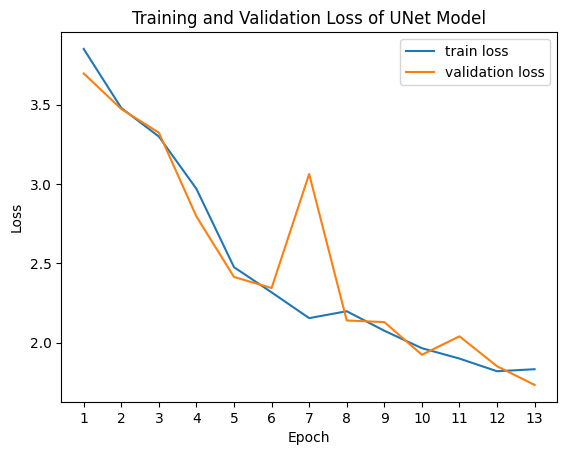

In [ ]:
# Visualization: Plot training and validation loss
epochs=13
plt.plot(range(1,epochs+1), history.history['loss'], label='train loss')
plt.plot(range(1,epochs+1), history.history['val_loss'], label='validation loss')
plt.xticks(range(1,epochs+1))
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title("Training and Validation Loss of UNet Model")
plt.legend()
plt.show()

## 7.3 Training and Validation Accuracy of UNet
We observed that training and validation accuracies stagnate around epoch 13. This shows evidence that we have trained long enough and the model has converged.

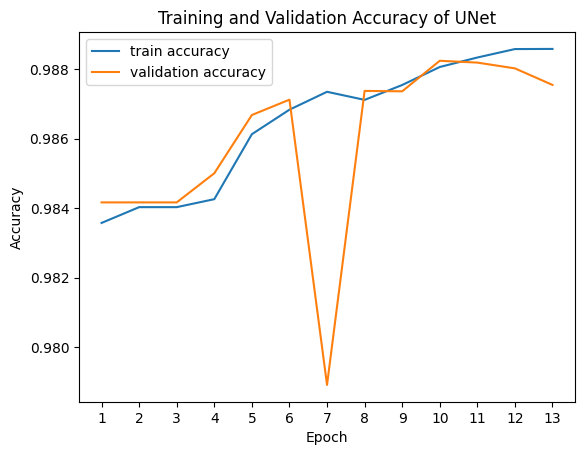

In [ ]:
# Visualization: Plot accuracy
epochs=13
plt.plot(range(1,epochs+1), history.history['accuracy'], label='train accuracy')
plt.plot(range(1,epochs+1), history.history['val_accuracy'], label='validation accuracy')
plt.xticks(range(1,epochs+1))
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title("Training and Validation Accuracy of UNet")
plt.legend()
plt.show()

## 7.4 Visualization of Segmented Tumors By UNet and True Tumor Masks
Five random samples are drawn from the testing set for visualization. The top row shows the originial brain MRI image with the ground true tumor mask superimposed and the bottom row shows the original image with the segmented tumor superimposed. Comparing the two rows, it appears that our UNet model was able to correctly detect the tumor and locate the position of the tumor in the brain. However, our segmentation model fails to capture the exact geometry of the tumor (i.e., too small or too large, incorrect tumor shape). The segmented tumors appear to have less irregularities as compared to the actual shape of the tumors. This shows that we may need a better model for segmenting tumors.

1/1 [==============================] - 0s 25ms/step


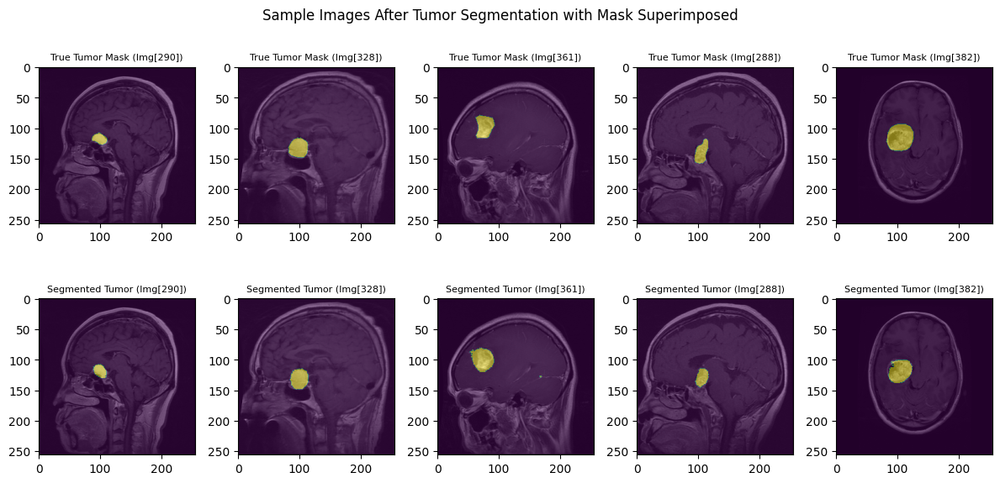

In [ ]:
# Test samples
X_test_RGB = np.repeat(X_test, 3, axis=3)

# visualize
nrows = 2
ncols = 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=[12, 6])
idx_list = np.array(range(len(X_test)))

for j in np.arange(ncols):
    idx = np.random.choice(idx_list)
    z_ped = unet_model.predict(X_test_RGB[idx].reshape(1,256,256,3))
    z_ped = np.where(z_ped > 0.5, 1, 0)
    ax[0,j].imshow(Z_test[idx], alpha=1)
    ax[0,j].imshow(X_test_RGB[idx], alpha=0.5)
    ax[0,j].set_title(f"True Tumor Mask (Img[{idx}])", fontsize=8)
    ax[1,j].imshow(z_ped[0,:], alpha=1)
    ax[1,j].imshow(X_test_RGB[idx], alpha=0.5)
    ax[1,j].set_title(f"Segmented Tumor (Img[{idx}])", fontsize=8)

plt.subplots_adjust(wspace=0, hspace=0.1)
plt.suptitle('Sample Images After Tumor Segmentation with Mask Superimposed')
plt.tight_layout()

## 7.5 IOU and DICE on Test Set By UNet
Evaluating our UNet model on the test set, it has an IOU of 0.3307 and DICE of 0.4971, which is good. However, since the higher IOU and higher DICE, the better the model performance, there is still room for improvement. Therefore, alternative segmentation models are also explored later.

In [ ]:
# Test IOU and DICE
z_preds = unet_model.predict(X_test_RGB)
z_preds = np.where(z_preds > 0.5, 1, 0)
iou_score = np.round(intersection_over_union(Z_test, z_preds), 4)
dice_score = np.round(DICE(Z_test, z_preds), 4)
print(f"IOU: {iou_score}")
print(f"DICE: {dice_score}")

20/20 [==============================] - 1s 61ms/step
IOU: 0.3307
DICE: 0.4971


<a id="part8"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **8.0 Advanced Tumor Detection and Segmentation Model 1: LinkNet**

<a id="part8"></a>

[Return to contents](#contents)

## 8.1 LinkNet Architecture
LinkNet is a lightweight deep neural network used for segmentation. This model architecture can be used for tasks in self-driving cars, augmented reality, and etc. We believe that this model can also be applied to our tumor segmentation task. There are two main differences between UNet and LinkNet. LinkNet is more computationally efficient as it has fewer parameters and requires less memory than UNet. Since we have limited computational resources, LinkNet is an attractive alternative model for our project. In addition, LinkNet extracts features at different levels of details by using an encoder with residual connections that add the output of the encoder layer to the output of the corresponding decoder layer while UNet uses skip connections to connect the encoder and decoder layers. Overall, LinkNet is more computationally efficient and some studies have shown that LinkNet can outperform UNet on certain segmentation tasks. Therefore, we choose to explore LinkNet for tumor segmentation.

Our LinkNet model consists of five convolutional encoder blocks and five upsampling decoder blocks. `relu` activation is used to introduce non-linearity into the model. `sigmoid` activation is used in the last convolutional layer since this is a binary segmentation problem. During training, our customized weighted BCE loss function is used. Given the large amount of training data and trainable parameters, the training process of the model is time-consuming so we trained the model for 15 epochs with a batch size of 32. To prevent overfitting, we used 20% of the data as validation and applied early stopping with a patience of 3. 

We referred to this website for implementation: [LinkNet](https://codeac29.github.io/projects/linknet/).

In [ ]:
from keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, UpSampling2D, Concatenate
from keras.models import Model

def conv_block(inputs, filters, kernel_size=(3, 3), strides=(1, 1)):
    x = Conv2D(filters, kernel_size=kernel_size, strides=strides, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

def decoder_block(inputs, skip_features, filters, kernel_size=(3, 3), strides=(1, 1)):
    x = UpSampling2D(size=(2, 2))(inputs)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, filters, kernel_size, strides)
    return x

def LinkNet(input_shape=(256, 256, 3), num_classes=1):
    inputs = Input(shape=input_shape)

    # Encoder
    encoder1 = conv_block(inputs, 64, (7, 7), (2, 2))
    encoder2 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(encoder1)
    encoder2 = conv_block(encoder2, 64, (3, 3))
    encoder3 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(encoder2)
    encoder3 = conv_block(encoder3, 128, (3, 3))
    encoder4 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(encoder3)
    encoder4 = conv_block(encoder4, 256, (3, 3))
    encoder5 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(encoder4)
    encoder5 = conv_block(encoder5, 512, (3, 3))

    # Decoder
    decoder5 = decoder_block(encoder5, encoder4, 256)
    decoder4 = decoder_block(decoder5, encoder3, 128)
    decoder3 = decoder_block(decoder4, encoder2, 64)
    decoder2 = decoder_block(decoder3, encoder1, 64)

    # Output
    outputs = Conv2D(num_classes, (1, 1), activation='sigmoid')(decoder2)
    outputs = UpSampling2D(size=(2, 2))(outputs)

    # Model
    model = Model(inputs=inputs, outputs=outputs, name="LinkNet_model")
    return model

In [ ]:
# Build the LinkNet model
linknet_model = LinkNet()
linknet_model.summary()

Model: "LinkNet_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_76 (Conv2D)             (None, 128, 128, 64  9472        ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 64  256        ['conv2d_76[0][0]']              
 alization)                     )                                                     

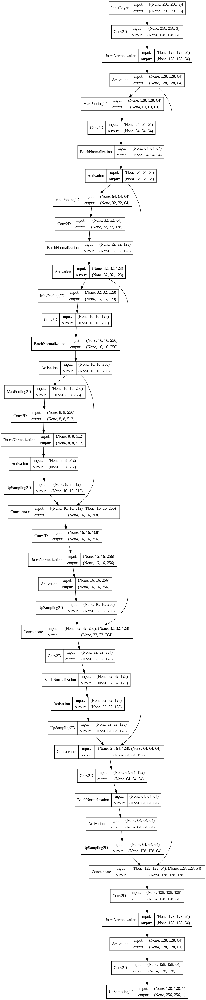

In [ ]:
# Compile and visualize the model
linknet_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=weighted_BCE_loss,
    metrics=["accuracy"],
)

tf.keras.utils.plot_model(linknet_model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
start=time.time()
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)
history = linknet_model.fit(X_train_aug_RGB, Z_train_aug, batch_size=32, epochs=15, callbacks = [early_stopping], validation_split=0.2)
end=time.time()

Epoch 1/15
174/174 [==============================] - 14s 44ms/step - loss: 4.6744 - accuracy: 0.9448 - val_loss: 5.2363 - val_accuracy: 0.9810
Epoch 2/15
174/174 [==============================] - 7s 38ms/step - loss: 1.9772 - accuracy: 0.9850 - val_loss: 2.6236 - val_accuracy: 0.9869
Epoch 3/15
174/174 [==============================] - 7s 38ms/step - loss: 1.4175 - accuracy: 0.9899 - val_loss: 2.8229 - val_accuracy: 0.9880
Epoch 4/15
174/174 [==============================] - 7s 38ms/step - loss: 1.1364 - accuracy: 0.9913 - val_loss: 2.0017 - val_accuracy: 0.9900
Epoch 5/15
174/174 [==============================] - 7s 38ms/step - loss: 0.9331 - accuracy: 0.9922 - val_loss: 1.9503 - val_accuracy: 0.9905
Epoch 6/15
174/174 [==============================] - 7s 38ms/step - loss: 0.8092 - accuracy: 0.9929 - val_loss: 0.9855 - val_accuracy: 0.9919
Epoch 7/15
174/174 [==============================] - 7s 38ms/step - loss: 0.7147 - accuracy: 0.9935 - val_loss: 1.6394 - val_accuracy: 0.988

In [ ]:
# Print training time
print('LinkNet model took : {} seconds to run!'.format(round((end-start))))

LinkNet model took : 109 seconds to run!


## 8.2 Training and Validation Loss of LinkNet
We observed that training and validation loss flatten around epoch 15, which is a good sign that we trained it long enough, and it has converged. 

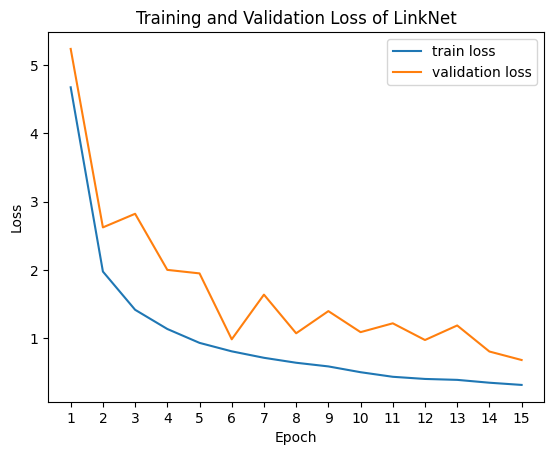

In [ ]:
# Visualization: Plot training and validation loss
epochs=15
plt.plot(range(1,epochs+1), history.history['loss'], label='train loss')
plt.plot(range(1,epochs+1), history.history['val_loss'], label='validation loss')
plt.xticks(range(1,epochs+1))
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title("Training and Validation Loss of LinkNet")
plt.legend()
plt.show()

## 8.3 Training and Validation Accuracy of LinkNet
We observed that training and validation accuracy flatten around epoch 15, which is a good sign that we trained it long enough, and it has converged. 

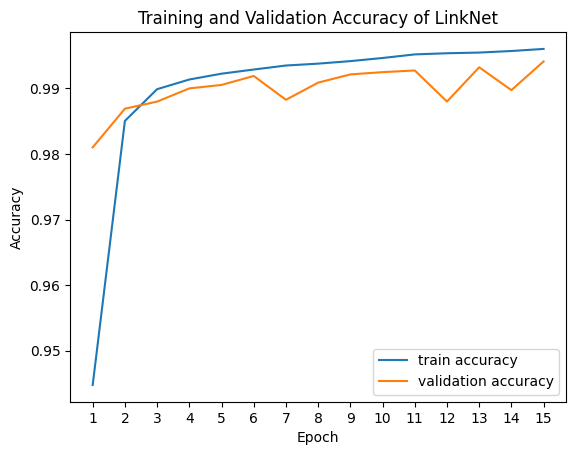

In [ ]:
# Visualization: Plot accuracy
plt.plot(range(1,epochs+1), history.history['accuracy'], label='train accuracy')
plt.plot(range(1,epochs+1), history.history['val_accuracy'], label='validation accuracy')
plt.xticks(range(1,epochs+1))
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title("Training and Validation Accuracy of LinkNet")
plt.legend()
plt.show()

## 8.4 Visualization of Segmented Tumors By LinkNet and True Tumor Masks
Similarly, five random samples are drawn from the testing set for visualization with the top row showing the true tumor mask and the bottom row showing the segmented tumor. Comparing the two rows, it appears that our LinkNet model was able to correctly detect the tumor and locate the position of the tumor in the brain. It can also handle the tumor boundaries better and segment the tumor with some irregularities captured in the tumor shapes. The shapes of the segmented tumor by the LinkNet are much more similar to the true tumor mask as compared to the shapes of the segmented tumor by the UNet. This shows evidence that LinkNet has better performance than UNet for tumor segmentation.

1/1 [==============================] - 0s 22ms/step


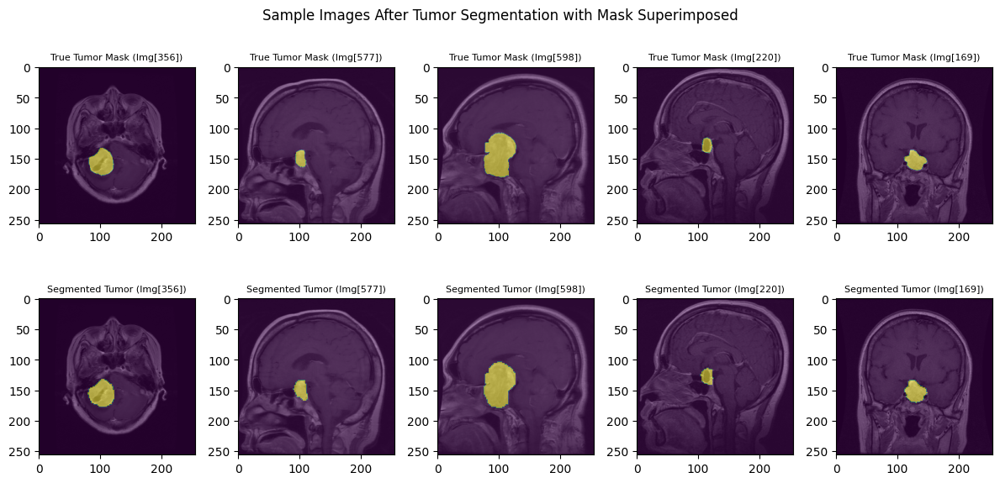

In [ ]:
# Visualize
nrows = 2
ncols = 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=[12, 6])
idx_list = np.array(range(len(X_test)))

for j in np.arange(ncols):
    idx = np.random.choice(idx_list)
    z_ped = linknet_model.predict(X_test_RGB[idx].reshape(1,256,256,3))
    z_ped = np.where(z_ped > 0.5, 1, 0)
    ax[0,j].imshow(Z_test[idx], alpha=1)
    ax[0,j].imshow(X_test_RGB[idx], alpha=0.5)
    ax[0,j].set_title(f"True Tumor Mask (Img[{idx}])", fontsize=8)
    ax[1,j].imshow(z_ped[0,:], alpha=1)
    ax[1,j].imshow(X_test_RGB[idx], alpha=0.5)
    ax[1,j].set_title(f"Segmented Tumor (Img[{idx}])", fontsize=8)

plt.subplots_adjust(wspace=0, hspace=0.1)
plt.suptitle('Sample Images After Tumor Segmentation with Mask Superimposed')
plt.tight_layout()

## 8.5 IOU and DICE on Test Set By LinkNet
Evaluating our LinkNet model on the test set, it has an IOU of 0.6282 and DICE of 0.7716, which is more than 50% higher than those of the UNet model. This reaffirms that the LinkNet model performs better than UNet on this data.

In [ ]:
# Test IOU and DICE
z_preds = linknet_model.predict(X_test_RGB)
z_preds = np.where(z_preds > 0.5, 1, 0)
iou_score = np.round(intersection_over_union(Z_test, z_preds), 4)
dice_score = np.round(DICE(Z_test, z_preds), 4)
print(f"IOU: {iou_score}")
print(f"DICE: {dice_score}")

20/20 [==============================] - 0s 14ms/step
IOU: 0.6282
DICE: 0.7716


<a id="part9"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **9.0 Advanced Tumor Detection and Segmentation Model 2: DeeplabV3+**

<a id="part9"></a>

[Return to contents](#contents)

## 9.1 DeeplabV3+ Architecture
DeeplabV3+ is memory-efficient as well. DeeplabV3+ employs a global pooling layer and a 1x1 convolutional layer to make the best use of computation, reducing the number of parameters in the network and improving computational efficiency. As a result, it can handle large images with a relatively small memory requirement, making it a valuable tool for real-time or low-power applications.

In addition to efficiency, we also want to improve our baseline UNet segmentation model by adding multi-scale contextual information. By utilizing an atrous (dilated) convolutional network, DeeplabV3+ can gather contextual information from different scales in the image, enabling it to effectively handle objects with varying sizes and scales. This feature is especially beneficial for semantic segmentation tasks.

For our DeeplabV3+ model, we applied transfer learning by including the pretrained ResNet50 model trained on the ImageNet dataset as our encoder. The Atrous Spatial Pyramid Pooling (ASPP) module consists of 4 convolution blocks with dilation rates of 1, 6, 12, and 18. This is used for capturing contextual information with different levels of details. The decoder has 4 upsampling blocks. Each upsampling block has a concatenation operation followed by a convolution block with `relu` activation. A 1x1 convolutional layer is added after the decoder with `sigmoid` activation to produce the final segmentation output. During training, our customized weighted BCE loss function is used. Given the large amount of training data and trainable parameters, the training process of the model is time-consuming so we trained the model for 8 epochs with a batch size of 32. 

The reference for the DeeplabV3+ model description and implementation can be found here: [DeeplabV3+](https://keras.io/examples/vision/deeplabv3_plus/). Below illustrates the architecture of the DeeplabV3+ model.

![](https://github.com/lattice-ai/DeepLabV3-Plus/raw/master/assets/deeplabv3_plus_diagram.png)


In [ ]:
# Define convolution block
def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    padding="same",
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return tf.nn.relu(x)

# Define Dilated Spatial Pyramid Pooling layer
def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]), interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

In [ ]:
# Define DeeplabV3+ model 
def DeeplabV3Plus(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)
    
    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    return keras.Model(inputs=model_input, outputs=model_output)

In [ ]:
# Build the DeeplabV3+ model
deeplab_model = DeeplabV3Plus(image_size=256, num_classes=1)
deeplab_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_10[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

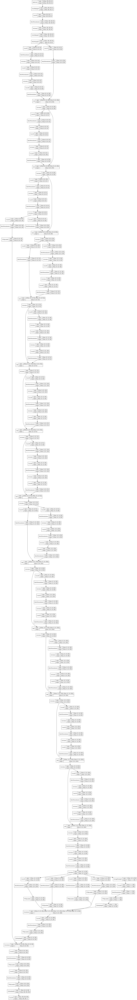

In [ ]:
# Compile and visualize the model
deeplab_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=weighted_BCE_loss,
    metrics=["accuracy"],
)

tf.keras.utils.plot_model(deeplab_model, show_shapes=True, show_layer_names=False)

In [ ]:
# Train the model
start=time.time()
history = deeplab_model.fit(X_train_aug_RGB, Z_train_aug, batch_size=32, epochs=8)
end=time.time()

Epoch 1/8
217/217 [==============================] - 59s 111ms/step - loss: 3.7648 - accuracy: 0.9470
Epoch 2/8
217/217 [==============================] - 24s 111ms/step - loss: 1.6373 - accuracy: 0.9841
Epoch 3/8
217/217 [==============================] - 24s 111ms/step - loss: 1.2776 - accuracy: 0.9877
Epoch 4/8
217/217 [==============================] - 24s 111ms/step - loss: 1.6121 - accuracy: 0.9887
Epoch 5/8
217/217 [==============================] - 24s 111ms/step - loss: 0.8842 - accuracy: 0.9924
Epoch 6/8
217/217 [==============================] - 24s 111ms/step - loss: 0.6793 - accuracy: 0.9936
Epoch 7/8
217/217 [==============================] - 24s 112ms/step - loss: 0.6815 - accuracy: 0.9937
Epoch 8/8
217/217 [==============================] - 24s 111ms/step - loss: 0.5353 - accuracy: 0.9945


In [ ]:
# Print training time
print('DeepLabv3+ model took : {} seconds to run!'.format(round((end-start))))

DeepLabv3+ model took : 236 seconds to run!


## 9.2 Training Loss of DeeplabV3+
We observed that training loss flatten around epoch 6, which is a good sign that we trained it long enough, and it has converged. 

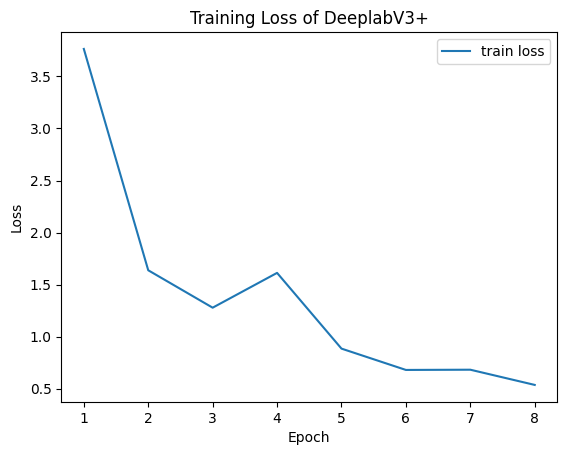

In [ ]:
# Visualization: Plot training loss
epochs=8
plt.plot(range(1,epochs+1), history.history['loss'], label='train loss')
plt.xticks(range(1,epochs+1))
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title("Training Loss of DeeplabV3+")
plt.legend()
plt.show()

## 9.3 Training Accuracy of DeeplabV3+
We observed that training accuracy flatten around epoch 6, which is a good sign that we trained it long enough, and it has converged. 

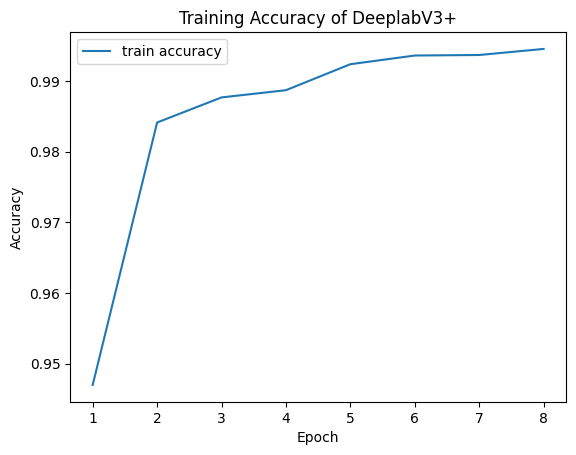

In [ ]:
# Visualization: Plot training accuracy
plt.plot(range(1,epochs+1), history.history['accuracy'], label='train accuracy')
plt.xticks(range(1,epochs+1))
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title("Training Accuracy of DeeplabV3+")
plt.legend()
plt.show()

## 9.4 Visualization of Segmented Tumors By DeeplabV3+ and True Tumor Masks
Similar as before, five random samples are drawn from the testing set for visualization with the top row showing the true tumor mask and the bottom row showing the segmented tumor. Comparing the two rows, it appears that our DeeplabV3+ model can also correctly detect the tumor and locate the position of the tumor in the brain. It can also handle the tumor boundaries better and segment the tumor with some irregularities captured in the tumor shapes. However, in terms of size, it appears that some segmented tumors are somewhat smaller or larger than the ground truth tumor mask. Overall, the shapes of the segmented tumor by the DeeplabV3+ model are much more similar to the true tumor mask as compared to the shapes of the segmented tumor by the UNet. This shows evidence that DeeplabV3+ has better performance than UNet for tumor segmentation.

1/1 [==============================] - 0s 25ms/step


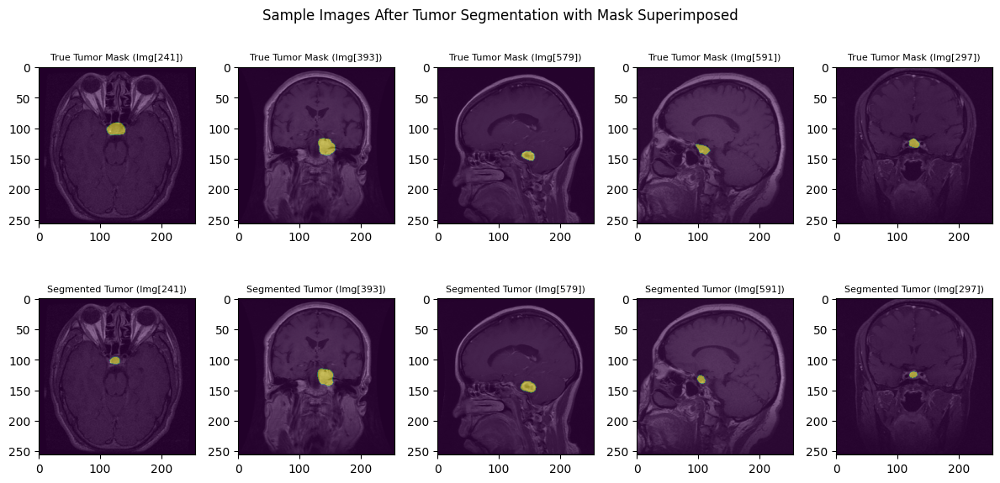

In [ ]:
# visualize
nrows = 2
ncols = 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=[12, 6])
idx_list = np.array(range(len(X_test)))

for j in np.arange(ncols):
    idx = np.random.choice(idx_list)
    z_ped = deeplab_model.predict(X_test_RGB[idx].reshape(1,256,256,3))
    z_ped = np.where(z_ped > 0.3, 1, 0)
    ax[0,j].imshow(Z_test[idx], alpha=1)
    ax[0,j].imshow(X_test_RGB[idx], alpha=0.5)
    ax[0,j].set_title(f"True Tumor Mask (Img[{idx}])", fontsize=8)
    ax[1,j].imshow(z_ped[0,:], alpha=1)
    ax[1,j].imshow(X_test_RGB[idx], alpha=0.5)
    ax[1,j].set_title(f"Segmented Tumor (Img[{idx}])", fontsize=8)

plt.subplots_adjust(wspace=0, hspace=0.1)
plt.suptitle('Sample Images After Tumor Segmentation with Mask Superimposed')
plt.tight_layout()

## 9.5 IOU and DICE on Test Set By DeeplabV3+
Evaluating our DeeplabV3+ model on the test set, it has an IOU of 0.5521 and DICE of 0.7115, which is also more than 40% higher than those of the UNet model. This reaffirms that the DeeplabV3+ model also performs better than UNet on this data. Comparing to the LinkNet model, the DeeplabV3+ model performs slightly worse in terms of IOU and DICE. This shows that LinkNet and DeeplabV3+ are both superior than UNet for the segmentation task. For future segmentation tasks, we would recommend exploring both LinkNet and DeeplabV3+ models. 

In [ ]:
# Test IOU and DICE
z_preds = deeplab_model.predict(X_test_RGB)
z_preds = np.where(z_preds > 0.5, 1, 0)
iou_score = np.round(intersection_over_union(Z_test, z_preds), 4)
dice_score = np.round(DICE(Z_test, z_preds), 4)
print(f"IOU: {iou_score}")
print(f"DICE: {dice_score}")

20/20 [==============================] - 1s 30ms/step
IOU: 0.5521
DICE: 0.7115


<a id="part10"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **10.0 Conclusion**

<a id="part10"></a>

[Return to contents](#contents)

In this project, we have explored different techniques for brain tumor detection and segmentation using deep learning models. We started by importing the necessary libraries and loading the dataset, such as keras and tensorflow. We then performed data preprocessing and exploratory data analysis to better understand the dataset, using techniques we learned in class, such as resize, data augmentation, one-hot encoding, and class re-balancing. 

Then, we formulated the project question and proposed two types of models: classification and segmentation. For classification, we implemented a feed-forward neural network (FFNN) as a baseline model, and a convolutional neural network (CNN) as an advanced model. We visualized the CNN model using activation maps and saliency maps. For tumor detection and segmentation, we implemented UNet as a baseline model, and LinkNet and DeeplabV3+ as advanced models. Our experiments show that advanced models outperform the baseline models in terms of accuracy and segmentation quality. Overall, deep learning models are powerful tools for detecting and segmenting brain tumors, and our results show promising potential for clinical use.

<a id="part11"></a>
    
<!-- <div class="alert alert-block alert-danger" style="color:black;background-color:#E7F4FA"> -->

# **11.0 Future Work**

<a id="part11"></a>

[Return to contents](#contents)

As we explored more than three models in our tasks, we have obtained a somehow thorough understanding of the problem and developed appropriate solutions. However, as the IoU and DICE of our models are still much below one, we believe there is still room for improvement of our model. We might use different optimization techniques on our model, such as RMSProp, and Adagrad. This may help improve the stability of the training process.

Pre-trained models can be very useful, as they can save time and resources compared to training a model from scratch. Transfer learning, which involves fine-tuning a pre-trained model on a new task, can also be a powerful approach for improving the performance of the model. In the future, we might continue to research on other available models or architectures that fit our goal, explore the pre-trained models, and incorporate new concepts.

# **Thank You!**